### Import library & Load Data

In [1]:
from util.repo_paths import AMAZON
# 라이브러리 불러오기
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

# 텍스트 데이터를 위한 라이브러리
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer

# 언어 감지 및 번역을 위한 라이브러리: langdetect 간편하게 사용할 수 있어서 선택, 
# Fasttext는 사전 학습된 모델을 다운 받아야 해서 미사용

# 바이그램 및 트리그램을 위한 라이브러리
from nltk.util import ngrams
from gensim.models import Phrases
from gensim.models.phrases import Phraser
from collections import Counter

# 팔레트 색상 테스트를 위한 라이브러리
from matplotlib.colors import LinearSegmentedColormap
from itertools import cycle
import plotly.graph_objects as go
import plotly.io as pio

# 틱톡커 추천을 위한 라이브러리
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

from wordcloud import WordCloud

# LDA 및 토픽 모델링을 위한 라이브러리
import gensim
from gensim.utils import simple_preprocess
# import gensim.corpora as corpora
from gensim import corpora
from pprint import pprint
import pyLDAvis

# 틱톡커 추천을 위한 라이브러리
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import intercluster_distance
from sklearn.metrics import silhouette_score


CWD = os.getcwd()

DATA_PATH = str(AMAZON)
print("현재 경로: ", CWD)

현재 경로:  /Users/jun/GitStudy/Data_4/src/project/project5/final_analysis_code


/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/yellowbrick/style/colors.py:35: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  mpl_ge_150 = LooseVersion(mpl.__version__) >= "1.5.0"
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/setuptools/_distutils/version.py:337: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/yellowbrick/style/rcmod.py:31: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  mpl_ge_150 = LooseVersion(mpl.__version__) >= "1.5.0"
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/setuptools/_distutils/version.py:337: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVers

#### 5. 자연어 처리

In [2]:
# 처리된 TikTok post 통합본 + 인플루언서 누적 통계 다시 로드.
# 키워드별 split이 필요 없어 통합본만 받아온다 (data_io.py의 load_keyword_dfs 참조).
from util.repo_paths import TIKTOK
from util.data_io import load_keyword_dfs

keyword_df = load_keyword_dfs()["all"]
tiktoker_df = pd.read_csv(TIKTOK / "tiktoker_final_df_0127.csv")


In [3]:
import re, string
# porter stemmer 초기화 및 영어 불용어 세트 생성 (캐글 참고)
stemmer = PorterStemmer()
nltk_stopwords = set(stopwords.words('english'))

# 특정 단어들을 불용어 목록에 추가
additional_stopwords = ['clean beauty', 'glow skin', 'kbeauty skin care', 'korean skincare', 'kbeauty', 'product', 'skincare', 'skin', 'beauty',
                        'Kbeauty', 'wonyoungism ', ' wonyoungism', 'wonyoungism', ' wonyoungism ', 'koreanskincare', 'Wonyoungism']
nltk_stopwords.update(additional_stopwords)

# 텍스트 전처리
def clean_text(text):
    if isinstance(text, str):
    
        # 소문자로 모두 변환
        text = text.lower()

        # URL 제거
        text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)

        # 마크다운 스타일 링크 제거
        text = re.sub(r'\[.*?\]\(.*?\)', '', text)

        # @ 제거
        text = re.sub(r'@\w+', '', text)

        # 구두점, 특수문자 제거
        text = text.translate(str.maketrans('', '', string.punctuation))

        return text
    else:
        return text

# 텍스트 토큰화
def tokenize_text(text):
    if isinstance(text, str):
        return word_tokenize(text)
    else:
        return text

# 불용어 제거
def remove_stopwords(tokens):
    if isinstance(tokens, list):
        print(f"Tokens: {tokens}")  # 중간 결과 확인
        print(f"Stopwords: {nltk_stopwords}")
        return [token for token in tokens if token not in nltk_stopwords]
    else:
        return tokens

# -> stemming 함수 추가
def stem_tokens(tokens):
    if isinstance(tokens, list):
        return [stemmer.stem(token) for token in tokens]
    else:
        return tokens

In [4]:
# keyword_df 자연어처리 저장
keyword_df['cleaned_info'] = keyword_df['info'].apply(clean_text)
keyword_df['cleaned_hash_tag'] = keyword_df['hash_tag'].apply(clean_text)

keyword_df['tokenized_info'] = keyword_df['cleaned_info'].apply(tokenize_text)
keyword_df['tokenized_hash_tag'] = keyword_df['cleaned_hash_tag'].apply(tokenize_text)

keyword_df['removed_info'] = keyword_df['tokenized_info'].apply(remove_stopwords)
keyword_df['removed_hash_tag'] = keyword_df['tokenized_hash_tag'].apply(remove_stopwords)

keyword_df['stpw_processed_info'] = keyword_df['removed_info'].apply(stem_tokens)
keyword_df['stpw_processed_hash_tag'] = keyword_df['removed_hash_tag'].apply(stem_tokens)

Tokens: ['replying', 'to', 'nontoxic', 'makeup', 'blushes', 'powder', 'cream', 'stick', 'cheek', 'stain', 'what', 'clean', 'swaps', 'do', 'you', 'want', 'to', 'see', 'next', 'brands', 'mentioned']
Stopwords: {'y', 'clean beauty', 'few', 'why', "didn't", 'and', 'by', 'm', "he'd", 'themselves', 'to', 'for', 'is', "shouldn't", 'been', 'so', "they'd", 've', 'above', 'all', 'couldn', "we've", 'itself', 're', 'her', 'are', "they've", "won't", 'yourselves', 'more', 'be', "that'll", 'hasn', "you're", 'only', 'once', "we'll", 'in', 'am', 'than', 'which', 'wonyoungism ', "wasn't", "don't", 'the', 'mightn', 'can', 'she', 'were', 'Wonyoungism', "they'll", 'until', 'any', "should've", 'then', 'up', "he'll", 'his', 'nor', 'both', "it's", 'd', 'weren', 'myself', 'theirs', 'wasn', 'through', 'these', 'kbeauty', "aren't", 'me', 'shouldn', 'he', 'ourselves', 'again', 'between', 'an', 'hers', 'himself', 'when', 'of', 'not', 'have', 'product', "it'll", 'about', 'don', 'ours', 'here', 'hadn', 'they', 'whom

In [5]:
# tiktoker_df 자연어처리 저장
tiktoker_df = tiktoker_df.rename(columns={'info_tag': 'info'})

tiktoker_df['cleaned_info'] = tiktoker_df['info'].apply(clean_text)
tiktoker_df['cleaned_hash_tag'] = tiktoker_df['hash_tag'].apply(clean_text)

tiktoker_df['tokenized_info'] = tiktoker_df['cleaned_info'].apply(tokenize_text)
tiktoker_df['tokenized_hash_tag'] = tiktoker_df['cleaned_hash_tag'].apply(tokenize_text)

tiktoker_df['removed_info'] = tiktoker_df['tokenized_info'].apply(remove_stopwords)
tiktoker_df['removed_hash_tag'] = tiktoker_df['tokenized_hash_tag'].apply(remove_stopwords)

tiktoker_df['stpw_processed_info'] = tiktoker_df['removed_info'].apply(stem_tokens)
tiktoker_df['stpw_processed_hash_tag'] = tiktoker_df['removed_hash_tag'].apply(stem_tokens)

Tokens: ['my', 'favourite', 'blushes', 'and', 'why', 'with', 'shades💓', 'you', 'can', 'find', 'them', 'at', 'using', 'rewards', 'cde', 'mydelicate10', '💓', 'knows', 'makeup', 'of', 'hur', 'kbeauty', 'cbeauty', 'koreanmakeup', 'skincare', 'wonyoungism', 'blush']
Stopwords: {'y', 'clean beauty', 'few', 'why', "didn't", 'and', 'by', 'm', "he'd", 'themselves', 'to', 'for', 'is', "shouldn't", 'been', 'so', "they'd", 've', 'above', 'all', 'couldn', "we've", 'itself', 're', 'her', 'are', "they've", "won't", 'yourselves', 'more', 'be', "that'll", 'hasn', "you're", 'only', 'once', "we'll", 'in', 'am', 'than', 'which', 'wonyoungism ', "wasn't", "don't", 'the', 'mightn', 'can', 'she', 'were', 'Wonyoungism', "they'll", 'until', 'any', "should've", 'then', 'up', "he'll", 'his', 'nor', 'both', "it's", 'd', 'weren', 'myself', 'theirs', 'wasn', 'through', 'these', 'kbeauty', "aren't", 'me', 'shouldn', 'he', 'ourselves', 'again', 'between', 'an', 'hers', 'himself', 'when', 'of', 'not', 'have', 'product

## PART 2: EDA & Data Analysis ( + 파생변수 생성)

#### 1. keyword_df

##### 1-1. 워드클라우드

/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(


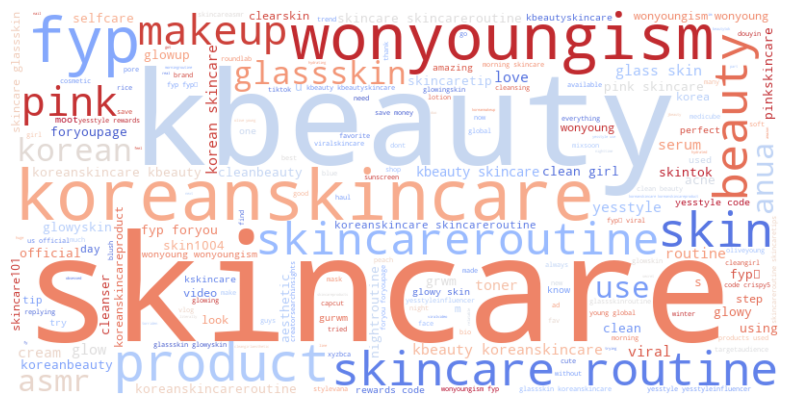

In [6]:
# keyword_df 영상설명 워드클라우드
wordcloud = WordCloud(width=800, height=400, 
                      background_color='white', colormap='coolwarm').generate(' '.join(keyword_df['cleaned_info'].dropna()))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Tiktok Vedio Information")
plt.show()

In [7]:
# keyword_df 해시태그 일렬로 정렬
tag_final_list = []
for i in range(len(keyword_df)):
    tags = str(keyword_df['hash_tag'][i])
    tags_list = tags.split(',')
    tag_final_list.append(tags_list)
tag_flat_list = sum(tag_final_list,[])
tag_df = pd.DataFrame({'tag':tag_flat_list})
tag_df

,tag
0,@user8022071884889
1,#greenscreen
2,#cleansers
3,#skincare
4,#beauty
...,...
6563,#koreanskincare
6564,#gurwm
6565,#gurwmroutine
6566,#grwm


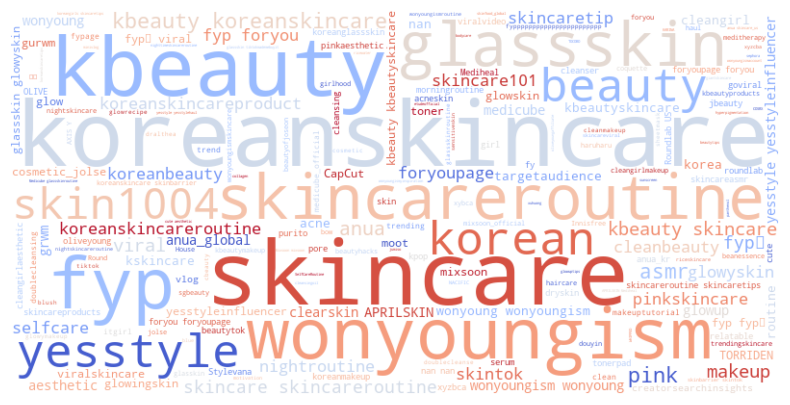

In [8]:
# keyword_df 해시태그 워드클라우드
wordcloud = WordCloud(width=800, height=400, 
                    background_color='white', colormap='coolwarm').generate(' '.join(tag_df['tag'].dropna()))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Tiktok Vedio Hash_tag")
plt.show()

##### 1-2. 자주 노출되는 인플루언서
- kbeauty인플루언서들 최신 영상 30개씩 추출할 때 사용 -> tiktoker_df생성
- 편의상 tiktoker_df 전처리도 위에서 진행함

In [9]:
# Float 형식을 일반 숫자 형식으로 변경
pd.options.display.float_format = '{:.2f}'.format

In [10]:
# kbeauty관련 키워드들 입력시 알고리즘에 의해 노출되는 모든 인플루언서들
keyword_df['tiktoker_name'].nunique()

358

In [11]:
# kbeauty관련 키워드들 입력 시 틱톡 알고리즘에 의해 3번 이상 노출된 인풀루우언서들
# 58명 / 358명명 -> tiktoker_df만들 때 사용됨 
tiktoker_cnt = keyword_df['tiktoker_name'].value_counts().reset_index()
tiktoker_cnt[tiktoker_cnt['count'] >= 3]

,tiktoker_name,count
0,mydelicate,37
1,velcroluv,33
2,caspertheghostyy,20
3,bwnniewony,17
4,milkydew,15
5,aeiezo.pdf,15
6,emchu_,14
7,songofskin,13
8,4chriisty,13
9,dearwonii_,11


##### 1-3. 업로드 일자

In [26]:
keyword_df[keyword_df.upload_date.isnull()]

,search_term,vedio_order,tiktoker_name,upload_date,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,cleaned_hash_tag,tokenized_info,tokenized_hash_tag,removed_info,removed_hash_tag,stpw_processed_info,stpw_processed_hash_tag,upload_date_str,upload_y_m
113,clean_beauty,114,songofskin,NaN,70500,327,6992,My moms approval comment 🥹💫 the glow is real w...,"#cleardea,#collagen,#realglow",my moms approval comment 🥹💫 the glow is real w...,cleardeacollagenrealglow,"[my, moms, approval, comment, 🥹💫, the, glow, i...",[cleardeacollagenrealglow],"[moms, approval, comment, 🥹💫, glow, real, coll...",[cleardeacollagenrealglow],"[mom, approv, comment, 🥹💫, glow, real, collage...",[cleardeacollagenrealglow],NaN,NaN
141,clean_beauty,142,foodishbeauty2.0,NaN,13700,104,1848,Use c0de TJ10 @RED CHAMBER US 💎 #cbeauty #redc...,"@RED,#cbeauty,#redchamber,#chinesemakeup,#douy...",use c0de tj10 chamber us 💎 cbeauty redchamber...,cbeautyredchamberchinesemakeupdouyinmakeup,"[use, c0de, tj10, chamber, us, 💎, cbeauty, red...",[cbeautyredchamberchinesemakeupdouyinmakeup],"[use, c0de, tj10, chamber, us, 💎, cbeauty, red...",[cbeautyredchamberchinesemakeupdouyinmakeup],"[use, c0de, tj10, chamber, us, 💎, cbeauti, red...",[cbeautyredchamberchinesemakeupdouyinmakeup],NaN,NaN
172,clean_beauty,173,fleur__belle,NaN,2212,40,279,girl therapy night✧🤍˚⋆ 𐙚⋆˚🎀 #girldiaries #vide...,"#girldiaries,#videodiary,#girlynight,#girlther...",girl therapy night✧🤍˚⋆ 𐙚⋆˚🎀 girldiaries videod...,girldiariesvideodiarygirlynightgirltherapygrwm...,"[girl, therapy, night✧🤍˚⋆, 𐙚⋆˚🎀, girldiaries, ...",[girldiariesvideodiarygirlynightgirltherapygrw...,"[girl, therapy, night✧🤍˚⋆, 𐙚⋆˚🎀, girldiaries, ...",[girldiariesvideodiarygirlynightgirltherapygrw...,"[girl, therapi, night✧🤍˚⋆, 𐙚⋆˚🎀, girldiari, vi...",[girldiariesvideodiarygirlynightgirltherapygrw...,NaN,NaN
355,glow skin,156,meimonte1,NaN,33800,153,14900,how did this rice mask brighten up my skin so ...,"#beautyofjoseon,#glassskin,#ricemask,#glowskin...",how did this rice mask brighten up my skin so ...,beautyofjoseonglassskinricemaskglowskinriceton...,"[how, did, this, rice, mask, brighten, up, my,...",[beautyofjoseonglassskinricemaskglowskinriceto...,"[rice, mask, brighten, much, need, even, try, ...",[beautyofjoseonglassskinricemaskglowskinriceto...,"[rice, mask, brighten, much, need, even, tri, ...",[beautyofjoseonglassskinricemaskglowskinriceto...,NaN,NaN


In [27]:
def upload_y_m(df):
    df['upload_date'] = pd.to_datetime(df['upload_date'], errors='coerce')
    df['upload_y_m'] = df['upload_date'].dt.strftime('%Y-%m')
    return df

keyword_df = upload_y_m(keyword_df)

In [28]:
date_groupby = keyword_df.groupby('upload_y_m')['search_term'].count().reset_index()
date_groupby

,upload_y_m,search_term
0,2020-02,1
1,2020-03,2
2,2020-05,2
3,2020-11,1
4,2021-02,1
5,2021-03,1
6,2021-05,1
7,2021-06,1
8,2021-07,2
9,2021-08,2


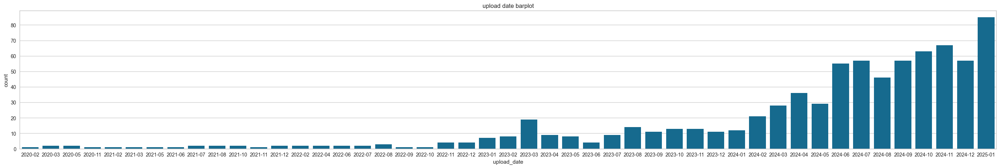

In [29]:
date_groupby = keyword_df.groupby('upload_y_m')['search_term'].count().reset_index()

fig, axes = plt.subplots(figsize=(35, 5), sharex=False)
sns.barplot(x='upload_y_m', y='search_term', data=date_groupby)
plt.title('upload date barplot')
plt.xlabel('upload_date')
plt.ylabel('count')
plt.show()

In [30]:
keyword_df.search_term.value_counts()

search_term
clean_beauty         200
kbeauty skin care    199
korean skincare      197
glow skin            187
Name: count, dtype: int64

##### 1-4. 최근 6개월 영상들 k-beauty관련 주요 해시태그

In [31]:
# 1️⃣ 최근 6개월 데이터 필터 + hash_tag - NaN 제거
recent_df = keyword_df[keyword_df['upload_date']>='2024-06-01']
recent_df = recent_df[recent_df['hash_tag'].notna()]
recent_df.head(3)

,search_term,vedio_order,tiktoker_name,upload_date,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,cleaned_hash_tag,tokenized_info,tokenized_hash_tag,removed_info,removed_hash_tag,stpw_processed_info,stpw_processed_hash_tag,upload_date_str,upload_y_m
0,clean_beauty,1,morganlkeen,2024-09-05,1563,73,894,Replying to @user8022071884889 Non-Toxic Makeu...,@user8022071884889,replying to nontoxic makeup blushes powder cr...,,"[replying, to, nontoxic, makeup, blushes, powd...",[],"[replying, nontoxic, makeup, blushes, powder, ...",[],"[repli, nontox, makeup, blush, powder, cream, ...",[],2024-09-05,2024-09
1,clean_beauty,2,therealkatiestone,2025-01-03,1337,102,189,#greenscreen new year new diagram #cleansers #...,"#greenscreen,#cleansers,#skincare,#beauty,#bea...",greenscreen new year new diagram cleansers ski...,greenscreencleansersskincarebeautybeautybrandw...,"[greenscreen, new, year, new, diagram, cleanse...",[greenscreencleansersskincarebeautybeautybrand...,"[greenscreen, new, year, new, diagram, cleanse...",[greenscreencleansersskincarebeautybeautybrand...,"[greenscreen, new, year, new, diagram, cleanse...",[greenscreencleansersskincarebeautybeautybrand...,2025-01-03,2025-01
4,clean_beauty,5,labmuffinbeautyscience,2024-06-22,5634,104,542,Clean beauty isn’t making products safer - tha...,#skincarescience,clean beauty isn’t making products safer that...,skincarescience,"[clean, beauty, isn, ’, t, making, products, s...",[skincarescience],"[clean, ’, making, products, safer, ’, problem...",[skincarescience],"[clean, ’, make, product, safer, ’, problem, m...",[skincaresci],2024-06-22,2024-06


In [32]:
# 해시태그만 추출 (# 유지)
def extract_hashtags(text):
    if isinstance(text, str):
        return re.findall(r'#\w+', text)
    return []


recent_df['tag_list'] = recent_df['hash_tag'].apply(extract_hashtags)

# 3️⃣ 리스트 형태를 개별 행으로 변환
tag_df = recent_df.explode('tag_list')[['tag_list']].rename(columns={'tag_list': 'tag'})

# 4️⃣ 공백 제거
tag_df = tag_df[tag_df['tag'].str.strip() != ""]

# 5️⃣ 태그별 등장 횟수 계산
tag_counts = tag_df['tag'].value_counts()

tag_counts


tag
#kbeauty              286
#koreanskincare       253
#skincare             247
#wonyoungism          194
#fyp                  134
                     ... 
#skincarefavorites      1
#ILLIYOONpartner        1
#일리윤                    1
#illiyoon               1
#gurwmroutine           1
Name: count, Length: 784, dtype: int64

In [33]:
tag_count =  tag_df["tag"].value_counts().reset_index()
tag_count = tag_count[tag_count['count'] >= 5]
tag_count

,tag,count
0,#kbeauty,286
1,#koreanskincare,253
2,#skincare,247
3,#wonyoungism,194
4,#fyp,134
...,...,...
130,#xybca,5
131,#kbeautymakeup,5
132,#kpopfyp,5
133,#skincareviral,5


/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 12471 (\N{KATAKANA LETTER SI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 52628 (\N{HANGUL SYLLABLE CU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 52380 (\N{HANGUL SYLLABLE CEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


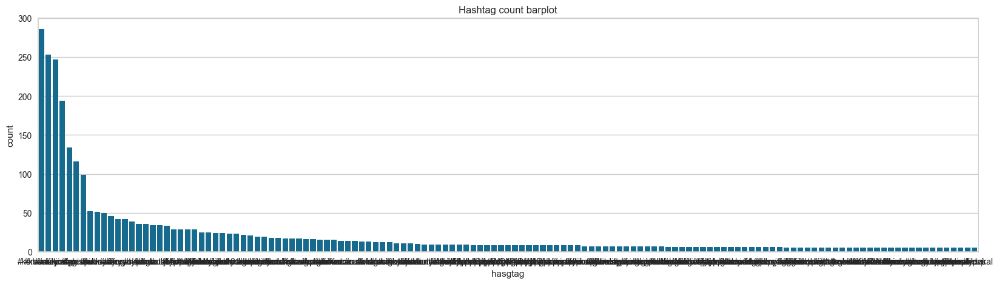

In [34]:
fig, axes = plt.subplots(figsize=(20, 5), sharex=False)
sns.barplot(x='tag', y='count', data=tag_count)
plt.title('Hashtag count barplot')
plt.xlabel('hasgtag')
plt.ylabel('count')
plt.show()

In [35]:
# 최근 6개월 상위 35개 해시태그
tag_count[tag_count['count']>=20]
# skincare, koreanskincare, kbeauty
# skincareroutine, glassskin, 
# glowyskin, viral, skintok, cleanbeauty, skincaretips, asmr, glowup, anua, pink, clearskin

# 우리 회사랑 잘 어울리는 해시태그
# skintok, #ASMR, #skincare

,tag,count
0,#kbeauty,286
1,#koreanskincare,253
2,#skincare,247
3,#wonyoungism,194
4,#fyp,134
5,#skincareroutine,116
6,#glassskin,99
7,#pink,52
8,#korean,51
9,#wonyoung,50


In [36]:
recent_df.columns

Index(['search_term', 'vedio_order', 'tiktoker_name', 'upload_date',
       'like_cnt', 'comment_cnt', 'save_cnt', 'info', 'hash_tag',
       'cleaned_info', 'cleaned_hash_tag', 'tokenized_info',
       'tokenized_hash_tag', 'removed_info', 'removed_hash_tag',
       'stpw_processed_info', 'stpw_processed_hash_tag', 'upload_date_str',
       'upload_y_m', 'tag_list'],
      dtype='str')

In [37]:
recent_df.tag_list

0                                                     []
1      [#greenscreen, #cleansers, #skincare, #beauty,...
4                                     [#skincarescience]
5                                                     []
10                  [#hygiene, #cleangirl, #hygienetips]
                             ...                        
777    [#cleanser, #acneskin, #bumpyskin, #kbeauty, #...
778    [#yslonglasting, #fyp, #kbeauty, #makeup, #kor...
780    [#koreanskincare, #skincarefavorites, #koreans...
781    [#skincare, #kbeauty, #wonyoungism, #koreanski...
782    [#ILLIYOONpartner, #일리윤, #illiyoon, #kbeauty, ...
Name: tag_list, Length: 468, dtype: object

In [38]:
recent_df.hash_tag

0                                     @user8022071884889
1      #greenscreen,#cleansers,#skincare,#beauty,#bea...
4                                       #skincarescience
5                                            @lifebylane
10                      #hygiene,#cleangirl,#hygienetips
                             ...                        
777    @WHIPPED,#cleanser,#acneskin,#bumpyskin,#kbeau...
778    #yslonglasting,#fyp,#kbeauty,#makeup,#korean,#...
780    @SUKOSHI,#koreanskincare,#skincarefavorites,#k...
781    #skincare,#kbeauty,#wonyoungism,#koreanskincar...
782    #ILLIYOONpartner,#일리윤,#illiyoon,#kbeauty,#skin...
Name: hash_tag, Length: 468, dtype: str

In [39]:
recent_df.columns

Index(['search_term', 'vedio_order', 'tiktoker_name', 'upload_date',
       'like_cnt', 'comment_cnt', 'save_cnt', 'info', 'hash_tag',
       'cleaned_info', 'cleaned_hash_tag', 'tokenized_info',
       'tokenized_hash_tag', 'removed_info', 'removed_hash_tag',
       'stpw_processed_info', 'stpw_processed_hash_tag', 'upload_date_str',
       'upload_y_m', 'tag_list'],
      dtype='str')

In [40]:
# 최근 6개월 태그 별 영상 수 및 총 좋아요 수 계산


# 1️영상 id 명시적으로 생성
tag_df = (
    recent_df
    .reset_index()                # index = 영상 id
    .rename(columns={'index': 'video_id'})
    .explode('tag_list')
    .rename(columns={'tag_list': 'tag'})
)

# 빈 태그 제거
tag_df = tag_df[
    tag_df['tag'].notna() &
    tag_df['tag'].str.startswith('#')
]

# 2️⃣ 태그별 집계
tag_count = (
    tag_df
    .groupby('tag')
    .agg(
        count=('tag', 'size'),              # 태그 등장 횟수
        video_cnt=('video_id', 'nunique'),  # ✅ 태그 포함 영상 수
        total_like=('like_cnt', 'sum')      # 영상 좋아요 합
    )
    .reset_index()
    .sort_values('video_cnt', ascending=False)
)

display(tag_count)


,tag,count,video_cnt,total_like
390,#kbeauty,286,282,14577997
420,#koreanskincare,253,249,21892345
613,#skincare,247,247,12822407
735,#wonyoungism,194,191,8664967
269,#fyp,134,134,6266383
...,...,...,...,...
352,#hugeskincare,1,1,111200
351,#howdoyounivea,1,1,26600
348,#homemade,1,1,853600
347,#holygrail,1,1,2097


In [41]:
# 최근 6개월 해시태그별 평균 좋아요수
tag_count['like_mean'] = tag_count['total_like']/tag_count['video_cnt']
tag_count

,tag,count,video_cnt,total_like,like_mean
390,#kbeauty,286,282,14577997,51695.02
420,#koreanskincare,253,249,21892345,87921.06
613,#skincare,247,247,12822407,51912.58
735,#wonyoungism,194,191,8664967,45366.32
269,#fyp,134,134,6266383,46764.05
...,...,...,...,...,...
352,#hugeskincare,1,1,111200,111200.00
351,#howdoyounivea,1,1,26600,26600.00
348,#homemade,1,1,853600,853600.00
347,#holygrail,1,1,2097,2097.00


In [42]:
# 최근 6개월간 해시태그별 영상 수 (Top 5)
# video_cnt 기준 상위 25% threshold 계산
threshold = tag_count['video_cnt'].quantile(0.75)

# 상위 20% 해시태그 추출
top20_usage_tags = (
    tag_count[tag_count['video_cnt'] >= threshold]
    .sort_values('video_cnt', ascending=False)
)

cols = ['tag','video_cnt','total_like','like_mean']

top20_usage_tags[cols]

,tag,video_cnt,total_like,like_mean
390,#kbeauty,282,14577997,51695.02
420,#koreanskincare,249,21892345,87921.06
613,#skincare,247,12822407,51912.58
735,#wonyoungism,191,8664967,45366.32
269,#fyp,134,6266383,46764.05
...,...,...,...,...
675,#tiktokshopfinds,3,20859,6953.00
381,#jellycleanser,3,32700,10900.00
489,#morningcleanser,3,198900,66300.00
398,#kbeautytiktok,3,322078,107359.33


In [43]:
top20_usage_tags[cols].head(20)

,tag,video_cnt,total_like,like_mean
390,#kbeauty,282,14577997,51695.02
420,#koreanskincare,249,21892345,87921.06
613,#skincare,247,12822407,51912.58
735,#wonyoungism,191,8664967,45366.32
269,#fyp,134,6266383,46764.05
627,#skincareroutine,114,9363334,82134.51
292,#glassskin,98,5296599,54046.93
531,#pink,52,2621321,50410.02
406,#korean,51,1754938,34410.55
734,#wonyoung,50,1872888,37457.76


In [44]:
tag_count.columns

Index(['tag', 'count', 'video_cnt', 'total_like', 'like_mean'], dtype='str')

---- 

한국 키워드 들어간 태그와 그렇지 않은 태그들의 평균 좋아요 비율

In [45]:
recent_df.tag_list

0                                                     []
1      [#greenscreen, #cleansers, #skincare, #beauty,...
4                                     [#skincarescience]
5                                                     []
10                  [#hygiene, #cleangirl, #hygienetips]
                             ...                        
777    [#cleanser, #acneskin, #bumpyskin, #kbeauty, #...
778    [#yslonglasting, #fyp, #kbeauty, #makeup, #kor...
780    [#koreanskincare, #skincarefavorites, #koreans...
781    [#skincare, #kbeauty, #wonyoungism, #koreanski...
782    [#ILLIYOONpartner, #일리윤, #illiyoon, #kbeauty, ...
Name: tag_list, Length: 468, dtype: object

In [46]:
# 해시태그별 영상 지표 리스트 생성

import numpy as np
import pandas as pd
from collections import defaultdict

# 해시태그별 지표 집계용
tag_to_metrics = defaultdict(lambda: {'like': [], 'comment': [], 'save': []})

for idx, row in recent_df.iterrows():
    for tag in row['tag_list']:
        tag_to_metrics[tag]['like'].append(row['like_cnt'])
        tag_to_metrics[tag]['comment'].append(row['comment_cnt'])
        tag_to_metrics[tag]['save'].append(row['save_cnt'])

# 데이터프레임으로 변환
tag_metrics_df = pd.DataFrame([
    {
        'tag': tag,
        'like_mean': np.mean(metrics['like']),
        'comment_mean': np.mean(metrics['comment']),
        'save_mean': np.mean(metrics['save']),
        'video_cnt': len(metrics['like'])
    }
    for tag, metrics in tag_to_metrics.items()
])


In [47]:
tag_metrics_df['tag'].value_counts()

tag
#greenscreen          1
#cleansers            1
#skincare             1
#beauty               1
#beautybrand          1
                     ..
#skincarefavorites    1
#ILLIYOONpartner      1
#일리윤                  1
#illiyoon             1
#gurwmroutine         1
Name: count, Length: 784, dtype: int64

In [48]:
# k_keyword 포함 여부 컬럼 추가
k_keyword = ["kbeauty", "koreanskincare"]
non_k_skincare = ["glassskin", "makeup", "skincareroutine", "skincare","skintok"]

def has_any(keyword_list, tag):
    return any(k in tag for k in keyword_list)

def assign_group(tag):
    if has_any(k_keyword, tag):
        return "k_keyword"
    elif has_any(non_k_skincare, tag):
        return "non_k_skincare_only"
    else:
        return "others"

tag_metrics_df["group"] = tag_metrics_df["tag"].apply(assign_group)

In [49]:
compare_df = tag_metrics_df[
    tag_metrics_df["group"].isin(["k_keyword", "non_k_skincare_only"])
]

In [50]:
# 1️⃣ 그룹별 평균 확인
grouped = compare_df.groupby("group")[["like_mean", "comment_mean", "save_mean"]].mean()

print("그룹별 평균값")
print(grouped)

그룹별 평균값
                     like_mean  comment_mean  save_mean
group                                                  
k_keyword            148428.58       1540.31   39261.99
non_k_skincare_only   96603.45        595.77   13415.67


In [51]:
# 2️⃣ 증가율 계산 (k_keyword vs others)

increase_pct = (
    (grouped.loc["k_keyword"] - grouped.loc["non_k_skincare_only"])
    / grouped.loc["non_k_skincare_only"]
    * 100
).round(2)

print("\nK-beauty 키워드 포함 태그 vs 일반 skincare 태그 평균 증가율(%)")
print(increase_pct)



K-beauty 키워드 포함 태그 vs 일반 skincare 태그 평균 증가율(%)
like_mean       53.65
comment_mean   158.54
save_mean      192.66
dtype: float64


In [52]:
# 3️⃣ 문장 형태로 출력
for metric in ["like_mean", "comment_mean", "save_mean"]:
    pct = increase_pct[metric]
    print(
        f"{metric.replace('_mean','').capitalize()} 기준으로 "
        f"K-beauty 태그가 일반 skincare 태그 대비 {pct}% 높다."
    )


Like 기준으로 K-beauty 태그가 일반 skincare 태그 대비 53.65% 높다.
Comment 기준으로 K-beauty 태그가 일반 skincare 태그 대비 158.54% 높다.
Save 기준으로 K-beauty 태그가 일반 skincare 태그 대비 192.66% 높다.


통계 검정 (독립표본 비교)

In [53]:
#shapiro(group_A)를 사용하면 : 표본 수가 많을수록 거의 항상 기각된다.

# from scipy.stats import shapiro, levene, ttest_ind, mannwhitneyu

# def compare_groups(metric):
#     group_A = tag_metrics_df[tag_metrics_df['group']=='k_keyword'][metric]
#     group_B = tag_metrics_df[
#         tag_metrics_df['group'] == 'non_k_skincare_only'
#     ][metric]


#     # 정규성
#     pA = shapiro(group_A)[1]
#     pB = shapiro(group_B)[1]

#     # 등분산성
#     p_levene = levene(group_A, group_B)[1]

#     # 검정 선택
#     if pA > 0.05 and pB > 0.05:
#         if p_levene > 0.05:
#             test, p = ttest_ind(group_A, group_B, equal_var=True)
#             method = f"{metric} 독립표본 t-test(등분산)"
#         else:
#             test, p = ttest_ind(group_A, group_B, equal_var=False)
#             method = f"{metric} Welch t-test(이분산)"
#     else:
#         test, p = mannwhitneyu(group_A, group_B, alternative='two-sided')
#         method = f"{metric} Mann-Whitney U test (비모수)"

#     print(f"{method} → 통계량: {test:.3f}, p-value: {p:.4f}")

# # 좋아요, 댓글, 저장 각각 검정
# for metric in ['like_mean','comment_mean','save_mean']:
#     compare_groups(metric)


| 상황               | 권장           |
| ---------------- | ------------ |
| 표본 수 충분 (n > 30) | Welch t-test |
| 분포 왜곡 심함         | Mann–Whitney |
| 분산 다름            | Welch t-test |

즉, Welch t-test를 기본값으로 두고보조적으로 비모수 검정 확인

In [54]:
from scipy.stats import levene, ttest_ind, mannwhitneyu
import numpy as np

def compare_groups(metric):
    group_A = tag_metrics_df[
        tag_metrics_df['group'] == 'k_keyword'
    ][metric].dropna()

    group_B = tag_metrics_df[
        tag_metrics_df['group'] == 'non_k_skincare_only'
    ][metric].dropna()

    # 등분산성만 확인 (Welch 여부 판단용)
    p_levene = levene(group_A, group_B)[1]

    # Welch t-test (기본)
    t_stat, p_t = ttest_ind(group_A, group_B, equal_var=False)

    # 비모수 검정 (보조 확인)
    u_stat, p_u = mannwhitneyu(group_A, group_B, alternative='two-sided')

    print(f"\n[{metric}]")
    print(f"Welch t-test → t={t_stat:.3f}, p={p_t:.4f}")
    print(f"Mann-Whitney U → U={u_stat:.3f}, p={p_u:.4f}")


for metric in ['like_mean','comment_mean','save_mean']:
    compare_groups(metric)



[like_mean]
Welch t-test → t=1.019, p=0.3180
Mann-Whitney U → U=1076.000, p=0.0298

[comment_mean]
Welch t-test → t=2.666, p=0.0156
Mann-Whitney U → U=1218.000, p=0.0009

[save_mean]
Welch t-test → t=1.684, p=0.1105
Mann-Whitney U → U=1094.000, p=0.0204


### 해석
K-beauty 키워드가 포함된 해시태그는 평균 반응도는 명확히 높다고 말하기 어렵지만,
분포 전체에서는 일반 skincare 태그 대비 유의미하게 우세하다.

1. like_mean (평균 좋아요)

| 검정           | p-value | 해석              |
| ------------ | ------- | --------------- |
| Welch t-test | 0.2861  | 평균 차이 유의 아님 |
| Mann–Whitney | 0.0249  | 분포 차이 유의    |

의미
- 평균은 일부 초대형 태그(outlier)에 크게 흔들림
- 그러나 중앙값 이상 비율, 전반적인 분포 위치는 K-beauty 쪽이 우세함.
바이럴 빈도는 더 높다고 해석하는 것이 맞다.



2. comment_mean (평균 댓글)

| 검정           | p-value | 해석               |
| ------------ | ------- | ---------------- |
| Welch t-test | 0.0145  | 평균 차이 유의     |
| Mann–Whitney | 0.0007  | 분포 차이 강하게 유의 |

의미
- 평균도 높고, 분포 전체도 우측 이동
- 가장 강한 효과 지표로 K-beauty 태그는 참여 유도(engagement depth)에 명확한 효과를 가지고 있다.

3. save_mean (평균 저장)

| 검정           | p-value | 해석                |
| ------------ | ------- | ----------------- |
| Welch t-test | 0.0999  | 평균 차이 경계적 비유의 |
| Mann–Whitney | 0.0159  | 분포 차이 유의      |


의미
- 일부 고저장 태그가 평균을 끌어내림. 하지만 대다수 태그에서는 저장 반응이 더 높음
- 실용 정보성 콘텐츠 효과를 나타낸다.

왜 이런 패턴이 나오는가? (데이터 구조 관점) 

| 현상         | 원인             |
| ---------- | -------------- |
| t-test 비유의 | 평균이 극단값에 민감    |
| U-test 유의  | 순위 기반 → robust |
| 댓글에서 가장 강함 | 커뮤니티·문화 정체성 반응 |

K-beauty 효과는 “일부 대박”이 아니라 “다수 콘텐츠의 일관된 우위” 형태로 나타난다.

“k-beauty 태그는 평균 반응이 일부 지표에서는 높게 나타났으나,
평균 차이를 일반화할 만큼 일관적이라고 보기는 어렵다.
다만 분포 전반에서는 대부분의 경우 더 높은 반응을 보였다.”

극단적인 바이럴 몇 개가 평균을 끌어올리는 구조가 아니라,
다수 콘텐츠에서 안정적으로 반응이 더 높게 나타난다.”

In [55]:
metrics = ['like_mean', 'comment_mean', 'save_mean']

median_summary = (
    tag_metrics_df
    .groupby('group')[metrics]
    .median()
    .round(2)
)

print("그룹별 지표 중앙값 (Median)")
display(median_summary)

그룹별 지표 중앙값 (Median)


,like_mean,comment_mean,save_mean
group,,,
k_keyword,76000.00,1165.00,13700.00
non_k_skincare_only,29233.33,286.86,5113.00
others,15052.24,170.50,2364.00


좋아요 (Like)
- k_keyword: 76,000
- non_k_skincare_only 대비 2.6배
- others 대비 5.0배

댓글 (Comment)
- k_keyword: 1,165
- non_k_skincare_only 대비 약 4.1배
- others 대비 약 6.5배

저장 (Save)
- k_keyword: 13,700
- non_k_skincare_only 대비 약 2.7배
- others 대비 약 5.7배

K-beauty 키워드를 포함한 콘텐츠는 단순 노출 증가가 아니라,
댓글·저장 등 고관여 지표에서 구조적인 반응성 우위를 보인다.

---

In [56]:
# 1) 영상 수가 적어 의미 없는 평균 제거
Q1 = tag_count["video_cnt"].quantile(0.25)
filtered = tag_count[tag_count["video_cnt"] >= Q1]

# 2) like_mean 기준 상위 20% threshold
threshold = filtered['like_mean'].quantile(0.80)

# 3) filtered 안에서 상위 20% 선택
top20_liked_tags = (
    filtered[filtered['like_mean'] >= threshold]
    .sort_values('like_mean', ascending=False)
)

top20_liked_tags[cols]

,tag,video_cnt,total_like,like_mean
156,#brookemonk,1,3500000,3500000.00
691,#tutorial,1,3500000,3500000.00
517,#oilcleansing,1,2400000,2400000.00
110,#asmrcleaning,1,2000000,2000000.00
190,#cleantok,1,2000000,2000000.00
...,...,...,...,...
692,#tutorialmakeup,1,104600,104600.00
567,#relatable,9,874300,97144.44
387,#jumisopartner,1,96700,96700.00
690,#trueclean,1,96700,96700.00


/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_72356/3498666097.py:20: UserWarning: Glyph 12471 (\N{KATAKANA LETTER SI}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_72356/3498666097.py:20: UserWarning: Glyph 52628 (\N{HANGUL SYLLABLE CU}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_72356/3498666097.py:20: UserWarning: Glyph 52380 (\N{HANGUL SYLLABLE CEON}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_72356/3498666097.py:20: UserWarning: Glyph 49828 (\N{HANGUL SYLLABLE SEU}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_72356/3498666097.py:20: UserWarning: Glyph 53416 (\N{HANGUL SYLLABLE KIN}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_72356/3498666097.py:20: UserWarn

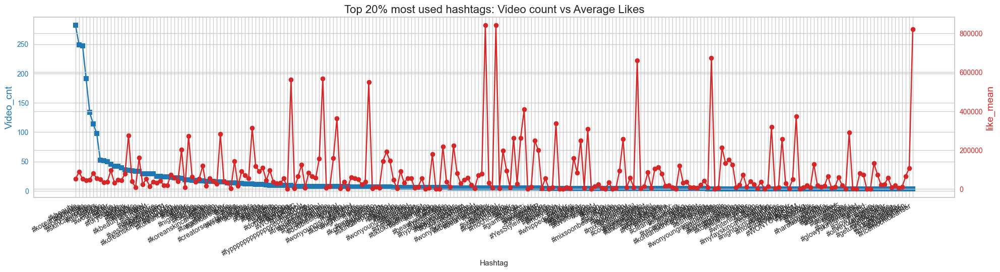

In [57]:
# 최근 6개월 사용량 상위20% 해시태그들의 사용된 영상 개수 대비 평균 좋아요 수

# left side : vedio_cnt
fig, ax1 = plt.subplots(figsize=(20, 5), sharex=False)
color_1 = 'tab:blue'
ax1.set_title('Top 20% most used hashtags: Video count vs Average Likes', fontsize=16)
ax1.set_xlabel('Hashtag')
ax1.set_ylabel('Video_cnt', fontsize=14, color=color_1)
ax1.plot(top20_usage_tags.tag, top20_usage_tags.video_cnt, marker='s', color=color_1)
ax1.tick_params(axis='y', labelcolor=color_1)

# right side : like_mean
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color_2 = 'tab:red'
ax2.set_ylabel('like_mean', fontsize=14, color=color_2)
ax2.plot(top20_usage_tags.tag, top20_usage_tags.like_mean, marker='o', color=color_2)
ax2.tick_params(axis='y', labelcolor=color_2)

# Rotate x-axis labels by 45 degrees
fig.tight_layout()
plt.xticks(rotation=45)

# To make sure the x-axis labels don't overlap and fit properly
fig.autofmt_xdate()

plt.show()

/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_72356/1281277588.py:23: UserWarning: Glyph 12471 (\N{KATAKANA LETTER SI}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_72356/1281277588.py:23: UserWarning: Glyph 51068 (\N{HANGUL SYLLABLE IL}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_72356/1281277588.py:23: UserWarning: Glyph 47532 (\N{HANGUL SYLLABLE RI}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_72356/1281277588.py:23: UserWarning: Glyph 50980 (\N{HANGUL SYLLABLE YUN}) missing from current font.
  fig.tight_layout()
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 51068 (\N{HANGUL SYLLABLE IL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniconda/base/envs

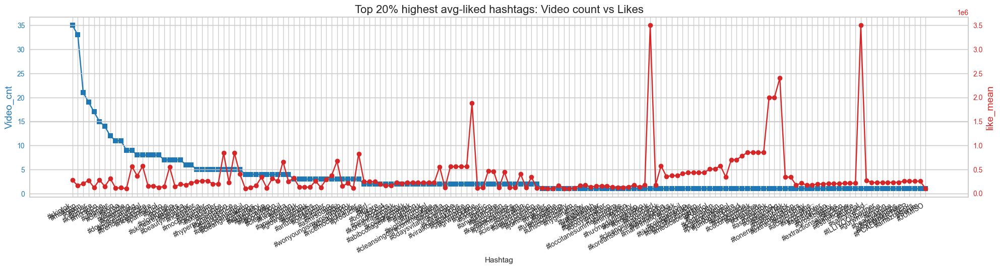

In [58]:
# 최근 6개월 좋아요 평균 상위20% 해시태그들의 사용된 영상 개수 대비 좋아요 수 + 영상 수가 적어 의미 없는 평균 제거됨

# video_cnt 기준 내림차순 정렬
top20_liked_tags_sorted = top20_liked_tags.sort_values('video_cnt', ascending=False).reset_index(drop=True)

# left side : vedio_cnt
fig, ax1 = plt.subplots(figsize=(20, 5), sharex=False)
color_1 = 'tab:blue'
ax1.set_title("Top 20% highest avg-liked hashtags: Video count vs Likes", fontsize=16)
ax1.set_xlabel('Hashtag')
ax1.set_ylabel('Video_cnt', fontsize=14, color=color_1)
ax1.plot(top20_liked_tags_sorted.tag, top20_liked_tags_sorted.video_cnt, marker='s', color=color_1)
ax1.tick_params(axis='y', labelcolor=color_1)

# right side : like_mean
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color_2 = 'tab:red'
ax2.set_ylabel('like_mean', fontsize=14, color=color_2)
ax2.plot(top20_liked_tags_sorted.tag, top20_liked_tags_sorted.like_mean, marker='o', color=color_2)
ax2.tick_params(axis='y', labelcolor=color_2)

# Rotate x-axis labels by 45 degrees
fig.tight_layout()
plt.xticks(rotation=45)

# To make sure the x-axis labels don't overlap and fit properly
fig.autofmt_xdate()

plt.show()

In [59]:
keyword_df.columns

Index(['search_term', 'vedio_order', 'tiktoker_name', 'upload_date',
       'like_cnt', 'comment_cnt', 'save_cnt', 'info', 'hash_tag',
       'cleaned_info', 'cleaned_hash_tag', 'tokenized_info',
       'tokenized_hash_tag', 'removed_info', 'removed_hash_tag',
       'stpw_processed_info', 'stpw_processed_hash_tag', 'upload_date_str',
       'upload_y_m'],
      dtype='str')

In [60]:
tiktoker_df.columns

Index(['name', 'follower_cnt', 'upload_date', 'view_cnt', 'like_cnt',
       'comment_cnt', 'save_cnt', 'info', 'hash_tag', 'cleaned_info',
       'cleaned_hash_tag', 'tokenized_info', 'tokenized_hash_tag',
       'removed_info', 'removed_hash_tag', 'stpw_processed_info',
       'stpw_processed_hash_tag'],
      dtype='str')

# typo 주의
 micro_influancer', 'mega_influancer', 'middle_influancer','mekro_influancer', 'nano_influancer

In [61]:
# 최소 광고비용 컬럼 파생변수 생성
def min_ad_cost_range(df):
    for i in range(len(df)):
        if df['follower_cnt'][i] >= 1000000:
            df.loc[i, 'tiktoker_size'] = 'mega_influancer'
            df.loc[i, 'ad_cost'] = df['follower_cnt'][i]*20000 # 숫자로 설정
        elif df['follower_cnt'][i] >= 500000:
            df.loc[i, 'tiktoker_size'] = 'mekro_influancer'
            df.loc[i, 'ad_cost'] = df['follower_cnt'][i]*20000
        elif df['follower_cnt'][i] >= 100000:
            df.loc[i, 'tiktoker_size'] = 'middle_influancer'
            df.loc[i, 'ad_cost'] = df['follower_cnt'][i]*20000
        elif df['follower_cnt'][i] >= 10000:
            df.loc[i, 'tiktoker_size'] = 'micro_influancer'
            df.loc[i, 'ad_cost'] = df['follower_cnt'][i]*20000
        elif df['follower_cnt'][i] >= 1000:
            df.loc[i, 'tiktoker_size'] = 'nano_influancer'
            df.loc[i, 'ad_cost'] = df['follower_cnt'][i]*20000
        else:
            df.loc[i, 'tiktoker_size'] = 'under_influancer'
            df.loc[i, 'ad_cost'] = 0 
min_ad_cost_range(tiktoker_df)

In [62]:
tiktoker_df.tiktoker_size.value_counts()

tiktoker_size
middle_influancer    630
micro_influancer     600
mega_influancer      240
nano_influancer      150
mekro_influancer      60
Name: count, dtype: int64

In [63]:
temp_df = (
    keyword_df
    .merge(tiktoker_df[['name', 'tiktoker_size']],
        how='inner',
        left_on='tiktoker_name',
        right_on='name')
    .drop(columns=['name'])
)

temp_df.tiktoker_size.unique()

<ArrowStringArray>
[ 'micro_influancer',   'mega_influancer', 'middle_influancer',
  'mekro_influancer',   'nano_influancer']
Length: 5, dtype: str


=== mega_influancer ===


/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_72356/3177559821.py:66: UserWarning: Glyph 51068 (\N{HANGUL SYLLABLE IL}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_72356/3177559821.py:66: UserWarning: Glyph 47532 (\N{HANGUL SYLLABLE RI}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_72356/3177559821.py:66: UserWarning: Glyph 50980 (\N{HANGUL SYLLABLE YUN}) missing from current font.
  fig.tight_layout()
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 51068 (\N{HANGUL SYLLABLE IL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 47532 (\N{HANGUL SYLLABLE RI}) missing from current font.
  fig.canvas.print_figure(bytes_

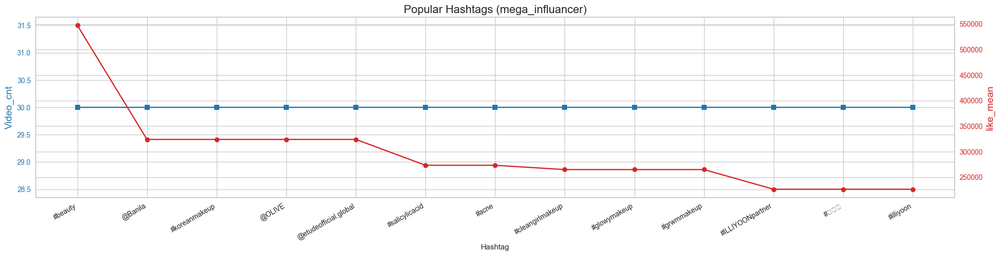


=== mekro_influancer ===


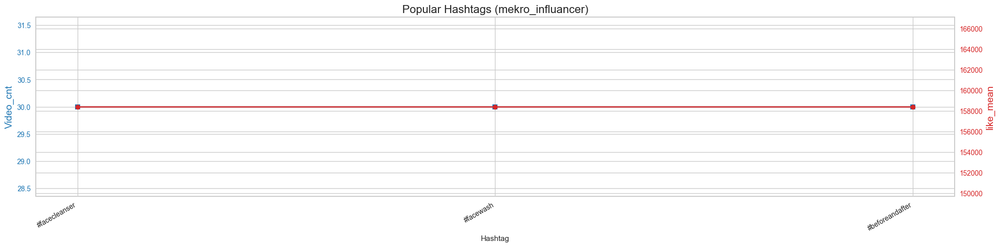


=== middle_influancer ===


/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_72356/3177559821.py:66: UserWarning: Glyph 12471 (\N{KATAKANA LETTER SI}) missing from current font.
  fig.tight_layout()
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 12471 (\N{KATAKANA LETTER SI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


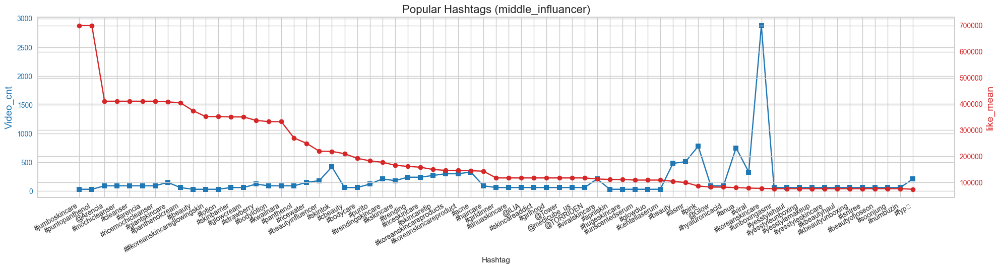


=== micro_influancer ===


/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_72356/3177559821.py:66: UserWarning: Glyph 12471 (\N{KATAKANA LETTER SI}) missing from current font.
  fig.tight_layout()
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 12471 (\N{KATAKANA LETTER SI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


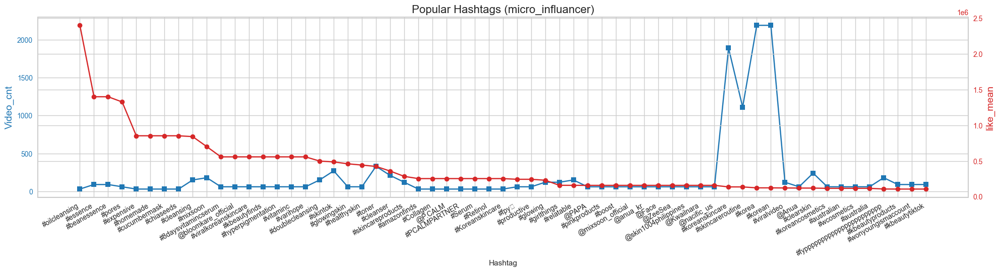


=== nano_influancer ===


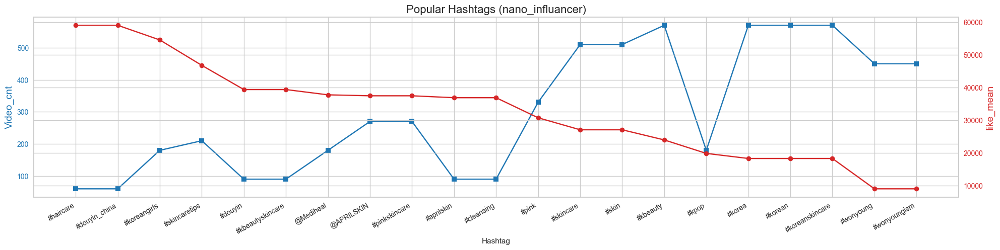

In [64]:
import pandas as pd
import matplotlib.pyplot as plt

def analyze_hashtags_by_size(keyword_df, tiktoker_df, size, recent_date='2024-06-01', min_tag_count=5, top_percent=0.2):
    """
    단일 인플루언서 사이즈별 해시태그 분석 및 시각화
    """
    # 1) 병합
    temp_df = keyword_df.merge(
        tiktoker_df[['name', 'tiktoker_size']],
        how='inner',
        left_on='tiktoker_name',
        right_on='name'
    ).drop(columns=['name'])
    
    # 2) 사이즈 필터링
    temp_df = temp_df[temp_df['tiktoker_size'] == size].copy()
    
    # 3) 최근 영상 필터링
    recent_df = temp_df[temp_df['upload_date'] >= recent_date].copy()
    recent_df['hash_tag'] = recent_df['hash_tag'].astype(str).fillna('')
    
    # 4) 해시태그 분리
    txt = ",".join(recent_df['hash_tag'])
    tag_df = pd.DataFrame(txt.split(","), columns=['tag'])
    tag_df = tag_df[tag_df['tag'].str.strip() != ""]
    
    # 5) 태그 등장 횟수 필터링
    tag_count = tag_df['tag'].value_counts().reset_index()
    tag_count.columns = ['tag', 'count']
    tag_count = tag_count[tag_count['count'] >= min_tag_count].reset_index(drop=True)
    
    # 6) 영상 수, 총 좋아요 계산
    recent_df['idx'] = recent_df.index
    tag_count['video_cnt'] = 0
    tag_count['total_like'] = 0
    for i in range(len(tag_count)):
        tag = tag_count.loc[i, 'tag']
        matched_videos = recent_df[recent_df['hash_tag'].str.contains(tag, regex=False)].copy()
        tag_count.loc[i, 'video_cnt'] = matched_videos['idx'].nunique()
        tag_count.loc[i, 'total_like'] = matched_videos.groupby('idx')['like_cnt'].first().sum()
    
    # 7) 평균 좋아요
    tag_count['like_mean'] = tag_count['total_like'] / tag_count['video_cnt']
    
    # 8) 상위 n% 태그만 필터링
    n_tags = max(1, int(len(tag_count) * top_percent))
    temp = tag_count.sort_values('like_mean', ascending=False).head(n_tags).reset_index(drop=True)
    
    # 9) 시각화
    fig, ax1 = plt.subplots(figsize=(20,5))
    color_1 = 'tab:blue'
    ax1.set_title(f'Popular Hashtags ({size})', fontsize=16)
    ax1.set_xlabel('Hashtag')
    ax1.set_ylabel('Video_cnt', fontsize=14, color=color_1)
    ax1.plot(temp.tag, temp.video_cnt, marker='s', color=color_1)
    ax1.tick_params(axis='y', labelcolor=color_1)

    ax2 = ax1.twinx()
    color_2 = 'tab:red'
    ax2.set_ylabel('like_mean', fontsize=14, color=color_2)
    ax2.plot(temp.tag, temp.like_mean, marker='o', color=color_2)
    ax2.tick_params(axis='y', labelcolor=color_2)
    
    plt.xticks(rotation=45)
    fig.tight_layout()
    fig.autofmt_xdate()
    plt.show()
    
    return tag_count

# 각 사이즈별 분석 반복
sizes = ['mega_influancer','mekro_influancer',  'middle_influancer', 'micro_influancer','nano_influancer']

size_tag_counts = {}
for sz in sizes:
    print(f"\n=== {sz} ===")
    size_tag_counts[sz] = analyze_hashtags_by_size(
        keyword_df, tiktoker_df, 
        size=sz, recent_date='2024-06-01',
        min_tag_count=5,
        top_percent=0.2
    )


In [65]:
keyword_df.columns

Index(['search_term', 'vedio_order', 'tiktoker_name', 'upload_date',
       'like_cnt', 'comment_cnt', 'save_cnt', 'info', 'hash_tag',
       'cleaned_info', 'cleaned_hash_tag', 'tokenized_info',
       'tokenized_hash_tag', 'removed_info', 'removed_hash_tag',
       'stpw_processed_info', 'stpw_processed_hash_tag', 'upload_date_str',
       'upload_y_m'],
      dtype='str')

#### 2. tiktoker_df

##### 2-1. 인플루언서 사이즈 구분 및 광고 단가 추정치
- 나노 인플루언서 (1,000–10,000 팔로워): 게시물당 $5~$25
- 마이크로 인플루언서 (10,000–100,000 팔로워): 게시물당 $25~$125
- 중간급 인플루언서 (100,000–500,000 팔로워): 게시물당 $125~$1,200
- 매크로 인플루언서 (500,000–1백만 팔로워): 게시물당 $1,200~$2,500
- 메가 인플루언서 (1백만+ 팔로워): 게시물당 $2,500 이상

##### 2-2. 평균 업로드 주기 계산(파생변수 생성)

In [66]:
import pandas as pd
import numpy as np
import re
from datetime import datetime, timedelta

# ✅ 현재 날짜 기준
TODAY = datetime(2025, 1, 27)  # 현재 날짜 설정

# ✅ 'date' 열을 변환하는 함수 (에러 방지 추가)
def parse_date(date_str):
    date_str = str(date_str).strip().lower()  # 공백 제거, 소문자 변환

    # 1️⃣ MM-DD 형식 변환 (예: "1-14" → 2025-01-14)
    match_mmdd = re.fullmatch(r"(\d{1,2})-(\d{1,2})", date_str)
    if match_mmdd:
        month, day = map(int, match_mmdd.groups())  # 월, 일 추출
        return datetime(2025, month, day)  # 2025년으로 변환

    # 2️⃣ 숫자 + 단위(h, d, w) 변환 (예: "14h", "3d", "2w")
    match_relative = re.fullmatch(r"(\d+)([hdw])(?:\s*ago)?", date_str)  # " ago" 처리 추가
    if match_relative:
        num, unit = int(match_relative.group(1)), match_relative.group(2)  # 숫자, 단위 분리
        
        if unit == "h":  # 시간 단위
            return TODAY - timedelta(hours=num)
        elif unit == "d":  # 일 단위
            return TODAY - timedelta(days=num)
        elif unit == "w":  # 주 단위 (1주 = 7일)
            return TODAY - timedelta(weeks=num)

    # 3️⃣ 날짜 형식(YYYY-MM-DD) 변환
    try:
        return pd.to_datetime(date_str)  # YYYY-MM-DD 형식 변환
    except Exception as e:
        print(f"Failed to parse date: {date_str}. Error: {e}")
        return np.nan  # 변환 실패 시 NaT 반환

# ✅ 'date' 열 변환
tiktoker_df["upload_date"] = tiktoker_df["upload_date"].apply(parse_date)

# ✅ name 별로 업로드 간격 계산
tiktoker_df = tiktoker_df.sort_values(by=["name", "upload_date"])  # 이름 + 날짜순 정렬
tiktoker_df["prev_date"] = tiktoker_df.groupby("name")["upload_date"].shift(1)  # 이전 영상 날짜
tiktoker_df["upload_gap"] = (tiktoker_df["upload_date"] - tiktoker_df["prev_date"]).dt.days  # 간격(일)

# ✅ 평균 업로드 주기 계산
upload_cycle = tiktoker_df.groupby("name")["upload_gap"].mean().reset_index()
upload_cycle.rename(columns={"upload_gap": "avg_upload_interval"}, inplace=True)

# ✅ 결과 출력
print(upload_cycle)

                 name  avg_upload_interval
0       .blissdiaries                 4.07
1             .m.egan                 5.03
2            .woniluv                 2.38
3           4chriisty                 2.48
4          __.annie.s                 3.14
5         _luvwonsnnx                 1.48
6          aeiezo.pdf                 3.48
7     ameenbeautytips                 0.17
8           amyflamy1                 1.45
9           asiamelon                 3.34
10           ayheyt3u                 5.76
11         aylennpark                 1.62
12         bwnniewony                 1.93
13   caspertheghostyy                 0.83
14     cleangirlhacks                 3.03
15   cleanlivingkarly                 0.55
16         danicolexx                 0.31
17         dearwonii_                 2.66
18             emchu_                 3.41
19          fromh1ae_                 2.21
20            gae4hrv                 3.59
21     glowupwithinah                 0.24
22         

In [67]:
tiktoker_df[ tiktoker_df.name == "dearwonii_"]

,name,follower_cnt,upload_date,view_cnt,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,...,tokenized_info,tokenized_hash_tag,removed_info,removed_hash_tag,stpw_processed_info,stpw_processed_hash_tag,tiktoker_size,ad_cost,prev_date,upload_gap
329,dearwonii_,217100.00,2024-11-04,534100,11900,251,2198,Your sign to literally exfoliate! Exfoliating ...,"#tonerpad,#exfoliate,#pores,##skincare,#kbeaut...",your sign to literally exfoliate exfoliating c...,...,"[your, sign, to, literally, exfoliate, exfolia...",[tonerpadexfoliateporesskincarekbeautybeautyto...,"[sign, literally, exfoliate, exfoliating, help...",[tonerpadexfoliateporesskincarekbeautybeautyto...,"[sign, liter, exfoli, exfoli, help, remov, pre...",[tonerpadexfoliateporesskincarekbeautybeautyto...,middle_influancer,4342000000.00,NaT,NaN
328,dearwonii_,217100.00,2024-11-07,109300,13400,430,1772,One of my favorite beauty supplements! 2 jars ...,"#beautysupplement,#beauty,#glasskin,#fyp,#fypシ...",one of my favorite beauty supplements 2 jars d...,...,"[one, of, my, favorite, beauty, supplements, 2...",[beautysupplementbeautyglasskinfypfypシtargetau...,"[one, favorite, supplements, 2, jars, down🤭sof...",[beautysupplementbeautyglasskinfypfypシtargetau...,"[one, favorit, supplement, 2, jar, down🤭softgl...",[beautysupplementbeautyglasskinfypfypシtargetaudi],middle_influancer,4342000000.00,2024-11-04,3.00
327,dearwonii_,217100.00,2024-11-14,62500,4295,219,522,the cream I only trust with my sensitive skin!...,"@일리윤,#illiyoon,#skincare,#kbeauty,#amazonfinds...",the cream i only trust with my sensitive skin ...,...,"[the, cream, i, only, trust, with, my, sensiti...",[illiyoonskincarekbeautyamazonfindssensitivesk...,"[cream, trust, sensitive, loving, cream, latel...",[illiyoonskincarekbeautyamazonfindssensitivesk...,"[cream, trust, sensit, love, cream, late, real...",[illiyoonskincarekbeautyamazonfindssensitivesk...,middle_influancer,4342000000.00,2024-11-07,7.00
326,dearwonii_,217100.00,2024-11-16,2000000,42300,450,3673,Everything in my skincare that I use in order ...,"#TikTokSuperBrandDay,#skincareroutine,#skin100...",everything in my skincare that i use in order ...,...,"[everything, in, my, skincare, that, i, use, i...",[tiktoksuperbranddayskincareroutineskin1004kbe...,"[everything, use, order, achieve, glowy, clear...",[tiktoksuperbranddayskincareroutineskin1004kbe...,"[everyth, use, order, achiev, glowi, clear, en...",[tiktoksuperbranddayskincareroutineskin1004kbe...,middle_influancer,4342000000.00,2024-11-14,2.00
325,dearwonii_,217100.00,2024-11-18,58700,4491,178,609,noni fruit is all my skin needs! Definitely my...,"#ampoule,#nonifruit,#skincare,#kbeauty,#beauty...",noni fruit is all my skin needs definitely my ...,...,"[noni, fruit, is, all, my, skin, needs, defini...",[ampoulenonifruitskincarekbeautybeautyfypシfypt...,"[noni, fruit, needs, definitely, savior, ampou...",[ampoulenonifruitskincarekbeautybeautyfypシfypt...,"[noni, fruit, need, definit, savior, ampoulece...",[ampoulenonifruitskincarekbeautybeautyfypシfypt...,middle_influancer,4342000000.00,2024-11-16,2.00
324,dearwonii_,217100.00,2024-11-21,71800,4434,197,521,If the popular COSRX snail mucin essence didn’...,"#ksecret,#skincare,#kbeauty,#beauty,#fypシ,#fyp...",if the popular cosrx snail mucin essence didn’...,...,"[if, the, popular, cosrx, snail, mucin, essenc...",[ksecretskincarekbeautybeautyfypシfyptargetaudi...,"[popular, cosrx, snail, mucin, essence, ’, wor...",[ksecretskincarekbeautybeautyfypシfyptargetaudi...,"[popular, cosrx, snail, mucin, essenc, ’, work...",[ksecretskincarekbeautybeautyfypシfyptargetaudi],middle_influancer,4342000000.00,2024-11-18,3.00
323,dearwonii_,217100.00,2024-11-22,75100,8024,358,918,grwm for a holiday!(winter edition❄️)#grwm #ma...,"#makeup,#winter,#beauty,#beautytok,#fypシ,#fyp,...",grwm for a holidaywinter edition❄️grwm makeup ...,...,"[grwm, for, a, holidaywinter, edition❄️grwm, m...",[makeupwinterbeautybeautytokfypシfyptargetaudie...,"[grwm, holidaywinter, edition❄️grwm, makeup,

In [68]:
# 1차 차분
tiktoker_df["upload_gap_diff"] = tiktoker_df.groupby("name")["upload_gap"].diff()
#그룹별 평균 변화량 한 번에 적용
tiktoker_df["avg_upload_gap_change"] = tiktoker_df.groupby("name")["upload_gap_diff"].transform("mean")


In [69]:
tiktoker_df.groupby('name')['upload_gap'].mean()

name
.blissdiaries        4.07
.m.egan              5.03
.woniluv             2.38
4chriisty            2.48
__.annie.s           3.14
_luvwonsnnx          1.48
aeiezo.pdf           3.48
ameenbeautytips      0.17
amyflamy1            1.45
asiamelon            3.34
ayheyt3u             5.76
aylennpark           1.62
bwnniewony           1.93
caspertheghostyy     0.83
cleangirlhacks       3.03
cleanlivingkarly     0.55
danicolexx           0.31
dearwonii_           2.66
emchu_               3.41
fromh1ae_            2.21
gae4hrv              3.59
glowupwithinah       0.24
haruqhxz             5.62
heartsfor.kbeauty    2.59
its.kaylas           1.31
itsedonna            1.31
izzydiaries          3.38
jaerini              9.14
jasminnlily_         2.24
jeb_bi               1.86
koocat               1.72
krystallee2222       2.24
kwyeona              2.31
lovelymiri05         0.62
luvsfor.jennie       1.21
milkydew             0.52
minseonk1m           0.83
misscasxie           4.48
monakoa

##### 2-3. 업로드 일자 확인

In [70]:
def upload_y_m(df):
    df['upload_date_str'] = df['upload_date'].astype(str)
    for i in range(len(df)):
        date = df['upload_date_str'][i]
        y_m = date[:7]
        df.loc[i,'upload_y_m'] = y_m

upload_y_m(tiktoker_df)

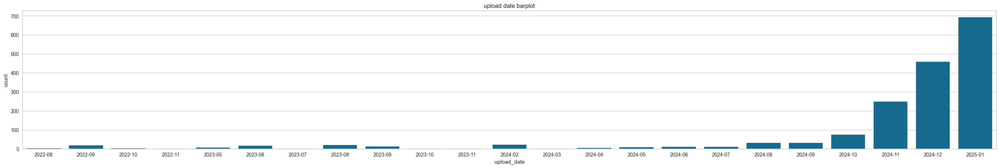

In [71]:
date_groupby = tiktoker_df.groupby('upload_y_m')['name'].count().reset_index()

fig, axes = plt.subplots(figsize=(35, 5), sharex=False)
sns.barplot(x='upload_y_m', y='name', data=date_groupby)
plt.title('upload date barplot')
plt.xlabel('upload_date')
plt.ylabel('count')
plt.show()

##### 2-4. 인플루언서별 정량적 지표 구하기

In [72]:
tiktoker_df.count()

name                       1680
follower_cnt               1680
upload_date                1680
view_cnt                   1680
like_cnt                   1680
comment_cnt                1680
save_cnt                   1680
info                       1664
hash_tag                   1620
cleaned_info               1664
cleaned_hash_tag           1620
tokenized_info             1664
tokenized_hash_tag         1620
removed_info               1664
removed_hash_tag           1620
stpw_processed_info        1664
stpw_processed_hash_tag    1620
tiktoker_size              1680
ad_cost                    1680
prev_date                  1624
upload_gap                 1624
upload_gap_diff            1568
avg_upload_gap_change      1680
upload_date_str            1680
upload_y_m                 1680
dtype: int64

In [73]:
len(tiktoker_df.name.unique())

56

In [74]:
# 인플루언서 선정은 ‘사람(계정)’ 단위로 이루어진다 그러므로 계정 전체의 평균 성과(Mean Engagement)를 보는 것이 자연스럽다

mean_df = tiktoker_df.groupby('name').agg({'follower_cnt':'mean',
                                    'view_cnt':'mean',
                                    'like_cnt':'mean',
                                    'comment_cnt':'mean',
                                    'save_cnt':'mean',
                                    'upload_gap':'mean',
                                    'tiktoker_size': 'max',
                                    'ad_cost':"mean"
                                    }).reset_index()
mean_df.head(3)

,name,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt,upload_gap,tiktoker_size,ad_cost
0,.blissdiaries,81700.00,9717.97,1447.33,60.47,196.20,4.07,micro_influancer,1634000000.00
1,.m.egan,238200.00,178070.00,23864.30,182.53,3527.30,5.03,middle_influancer,4764000000.00
2,.woniluv,135600.00,41956.20,2399.00,85.77,369.93,2.38,middle_influancer,2712000000.00


In [75]:
mean_df.count()

name             56
follower_cnt     56
view_cnt         56
like_cnt         56
comment_cnt      56
save_cnt         56
upload_gap       56
tiktoker_size    56
ad_cost          56
dtype: int64

In [76]:
min_ad_cost_range(mean_df)
mean_df.head(3)

,name,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt,upload_gap,tiktoker_size,ad_cost
0,.blissdiaries,81700.00,9717.97,1447.33,60.47,196.20,4.07,micro_influancer,1634000000.00
1,.m.egan,238200.00,178070.00,23864.30,182.53,3527.30,5.03,middle_influancer,4764000000.00
2,.woniluv,135600.00,41956.20,2399.00,85.77,369.93,2.38,middle_influancer,2712000000.00


In [77]:
# ER 구하기
# ER : ((좋아요 수 + 댓글 수) / 팔로워 수) * 100
mean_df['ER'] = ((mean_df['like_cnt']+mean_df['comment_cnt'])/mean_df['follower_cnt'])*100


# ERV 구하기
# ERV : ((좋아요 수 + 댓글 수 + 저장 수) / 조회수) * 100
mean_df['ERV'] = (mean_df['like_cnt'] + mean_df['comment_cnt'] + mean_df['save_cnt']) / mean_df['view_cnt'] * 100
mean_df.head(3)

,name,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt,upload_gap,tiktoker_size,ad_cost,ER,ERV
0,.blissdiaries,81700.00,9717.97,1447.33,60.47,196.20,4.07,micro_influancer,1634000000.00,1.85,17.53
1,.m.egan,238200.00,178070.00,23864.30,182.53,3527.30,5.03,middle_influancer,4764000000.00,10.10,15.48
2,.woniluv,135600.00,41956.20,2399.00,85.77,369.93,2.38,middle_influancer,2712000000.00,1.83,6.80


In [78]:
cols = ["follower_cnt", "view_cnt", "like_cnt", "comment_cnt", "save_cnt", "ER", "ERV"]

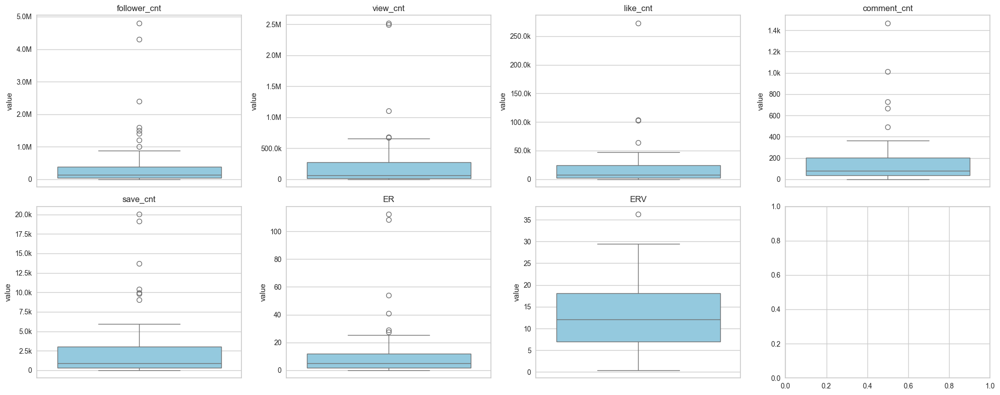

In [79]:
import matplotlib.ticker as mtick

def human_format(x, pos):
    if x >= 1e6:
        return f'{x*1e-6:.1f}M'
    elif x >= 1e3:
        return f'{x*1e-3:.1f}k'
    else:
        return f'{x:.0f}'

formatter = mtick.FuncFormatter(human_format)


fig, axes = plt.subplots(2, 4, figsize=(20, 8))

for ax, col in zip(axes.flatten(), cols):
    sns.boxplot(y=mean_df[col], ax=ax, color='skyblue')  # 색상 추가
    ax.set_title(col)
    ax.set_ylabel("value")
    ax.yaxis.set_major_formatter(formatter)

plt.tight_layout()
plt.show()

In [80]:
summary_stats = {}

for col in cols :
    summary_stats[col] = {
    "count": mean_df[col].count(),
    "mean": mean_df[col].mean(),
    "median": mean_df[col].median(),
    "std": mean_df[col].std(),
    "min": mean_df[col].min(),
    "max": mean_df[col].max()
    }

summary_df = pd.DataFrame(summary_stats).T
summary_df


,count,mean,median,std,min,max
follower_cnt,56.00,470629.54,142600.00,924280.71,4121.00,4800000.00
view_cnt,56.00,246204.17,59798.30,489895.19,1690.83,2518470.00
like_cnt,56.00,20198.40,7734.62,41024.61,73.27,272720.00
comment_cnt,56.00,174.63,80.58,260.20,0.50,1466.93
save_cnt,56.00,2836.41,920.40,4444.31,0.67,20036.77
ER,56.00,12.00,5.14,21.73,0.03,112.37
ERV,56.00,13.81,12.10,8.02,0.42,36.27


In [81]:
# 아웃라이어를 IQR 방식으로 확인
outlier_info = {}

for col in cols:
    Q1 = mean_df[col].quantile(0.25)
    Q3 = mean_df[col].quantile(0.75)
    IQR = Q3 - Q1
    outliers = mean_df[(mean_df[col] < Q1 - 1.5*IQR) | (mean_df[col] > Q3 + 1.5*IQR)]
    outlier_info[col] = {
        "outlier_count": len(outliers),
        "outlier_ratio": len(outliers)/len(mean_df)
    }

outlier_df = pd.DataFrame(outlier_info).T
print(outlier_df)

              outlier_count  outlier_ratio
follower_cnt           8.00           0.14
view_cnt               5.00           0.09
like_cnt               4.00           0.07
comment_cnt            5.00           0.09
save_cnt               7.00           0.12
ER                     6.00           0.11
ERV                    1.00           0.02


In [82]:
def remove_outlier_rows(df, cols):
    filtered_df = df.copy()
    for col in cols:
        Q1 = filtered_df[col].quantile(0.25)
        Q3 = filtered_df[col].quantile(0.75)
        IQR = Q3 - Q1
        # 한 컬럼이라도 아웃라이어면 제거
        filtered_df = filtered_df[(filtered_df[col] >= Q1 - 1.5*IQR) & (filtered_df[col] <= Q3 + 1.5*IQR)]
    return filtered_df

# 적용
filtered_df = remove_outlier_rows(mean_df, cols)

# 요약 통계 계산
summary_stats = {col: {
    "count": filtered_df[col].count(),
    "mean": filtered_df[col].mean(),
    "median": filtered_df[col].median(),
    "std": filtered_df[col].std(),
    "min": filtered_df[col].min(),
    "max": filtered_df[col].max()
} for col in cols}

summary_df = pd.DataFrame(summary_stats).T.round(2)
summary_df

,count,mean,median,std,min,max
follower_cnt,26.00,149388.46,79200.00,157452.04,13700.00,504500.00
view_cnt,26.00,37231.21,22648.40,39445.00,1690.83,157372.27
like_cnt,26.00,3299.07,2389.07,2843.38,73.27,9439.93
comment_cnt,26.00,61.35,46.02,56.00,0.50,222.23
save_cnt,26.00,528.47,377.65,431.11,0.67,1829.90
ER,26.00,3.73,2.12,3.64,0.05,14.39
ERV,26.00,13.75,14.33,7.72,3.62,28.73


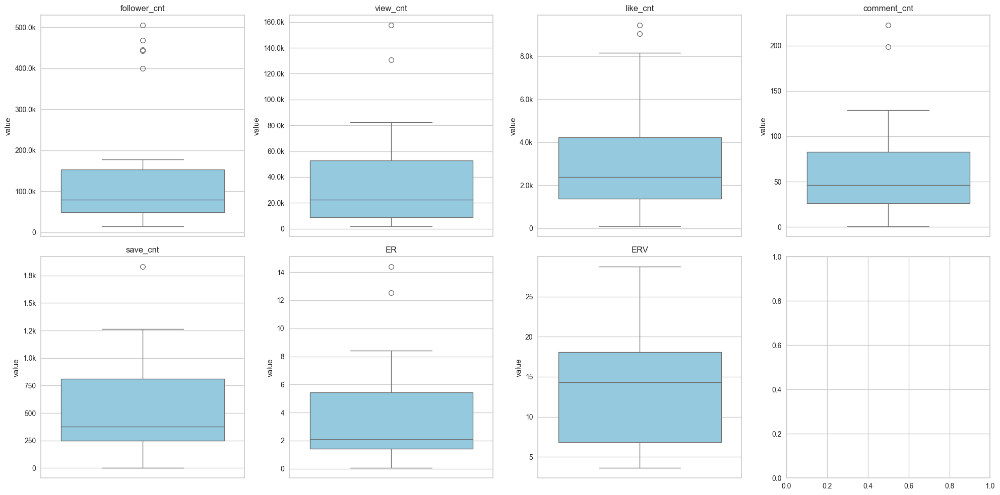

In [83]:
fig, axes = plt.subplots(2, 4, figsize=(20, 10))

for ax, col in zip(axes.flatten(), cols):
    sns.boxplot(y=filtered_df[col], ax=ax, color='skyblue')
    ax.set_title(col)
    ax.set_ylabel("value")
    ax.yaxis.set_major_formatter(formatter)

plt.tight_layout()
plt.show()


In [84]:
mean_df.tiktoker_size.unique()

<ArrowStringArray>
[ 'micro_influancer', 'middle_influancer',   'mega_influancer',
  'mekro_influancer',   'nano_influancer']
Length: 5, dtype: str

In [85]:
size_counts = mean_df.groupby('tiktoker_size')[cols[0]].count()  # cols[0] 아무 컬럼 하나 선택해도 됨
size_counts = size_counts.reset_index().rename(columns={cols[0]: 'count'})
print(size_counts)

       tiktoker_size  count
0    mega_influancer      8
1   mekro_influancer      2
2   micro_influancer     20
3  middle_influancer     21
4    nano_influancer      5


In [86]:
cols

['follower_cnt',
 'view_cnt',
 'like_cnt',
 'comment_cnt',
 'save_cnt',
 'ER',
 'ERV']

/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_72356/203892770.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_72356/203892770.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_72356/203892770.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_72356/203892770.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will 

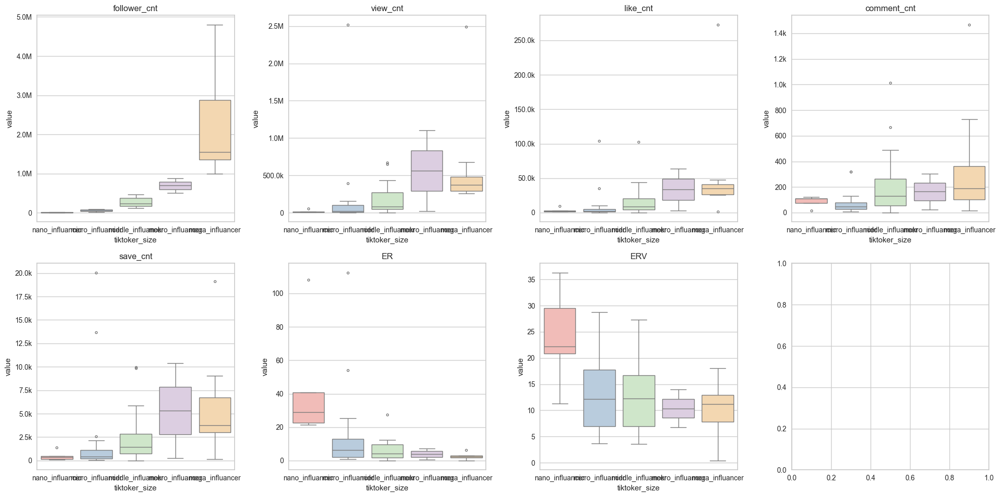

In [87]:
size_order = ['nano_influancer', 'micro_influancer', 'middle_influancer', 'mekro_influancer', 'mega_influancer']

# 박스플롯 시각화
fig, axes = plt.subplots(2,4, figsize=(20, 10))
for ax, col in zip(axes.flatten(), cols):
    sns.boxplot(
        x='tiktoker_size',
        y=col,
        data=mean_df,
        ax=ax,
        palette='Pastel1',
        order=size_order,  # 원하는 순서
        fliersize=3
    )
    ax.set_title(col)
    ax.set_ylabel("value")
    ax.yaxis.set_major_formatter(formatter)
plt.tight_layout()
plt.show()


In [88]:
size_order.reverse()

In [89]:
size_order

['mega_influancer',
 'mekro_influancer',
 'middle_influancer',
 'micro_influancer',
 'nano_influancer']

In [90]:
mean_df.columns

Index(['name', 'follower_cnt', 'view_cnt', 'like_cnt', 'comment_cnt',
       'save_cnt', 'upload_gap', 'tiktoker_size', 'ad_cost', 'ER', 'ERV'],
      dtype='str')

✅ 현재 폰트 적용됨: Arial Unicode MS


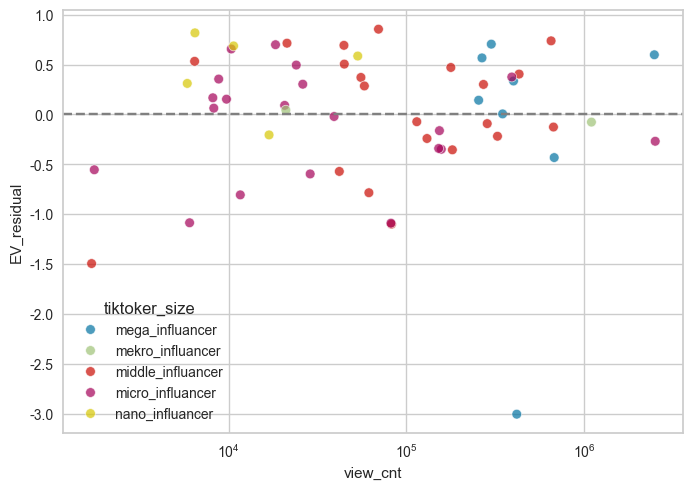

In [91]:
import statsmodels.api as sm
import pltfont
pltfont.auto()

mean_df['EV'] = (
    mean_df['like_cnt']
    + mean_df['comment_cnt']
    + mean_df['save_cnt']
)

X = sm.add_constant(np.log(mean_df['view_cnt']))
y = np.log(mean_df['EV'])

model = sm.OLS(y, X).fit()
mean_df['EV_residual'] = model.resid

sns.scatterplot(
    data=mean_df,
    x='view_cnt',
    y='EV_residual',
    hue='tiktoker_size',
    alpha=0.7,
    hue_order=size_order
)
plt.xscale('log')
plt.axhline(0, color='gray', linestyle='--')

/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_72356/2276148532.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


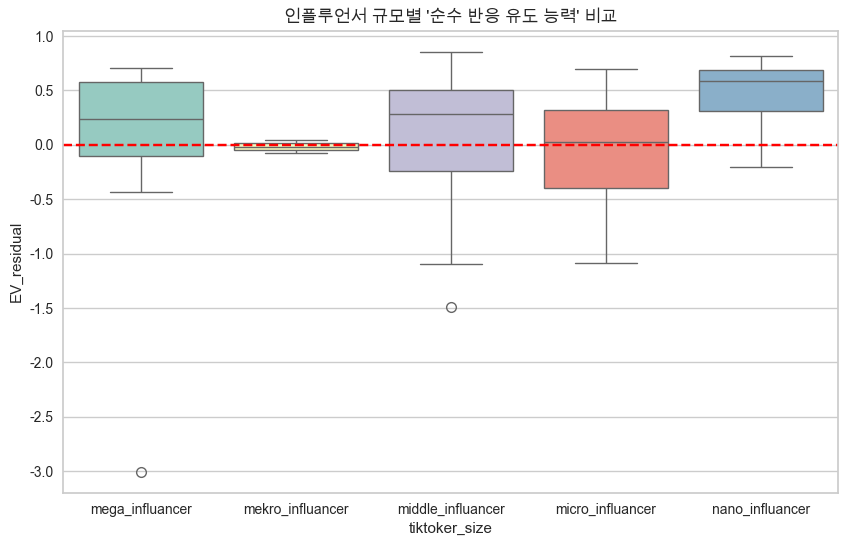

In [92]:
plt.figure(figsize=(10, 6))
sns.boxplot(
    data=mean_df,
    x='tiktoker_size',
    y='EV_residual',
    order=size_order,
    palette='Set3'
)
plt.axhline(0, color='red', linestyle='--')
plt.title("인플루언서 규모별 '순수 반응 유도 능력' 비교")
plt.show()

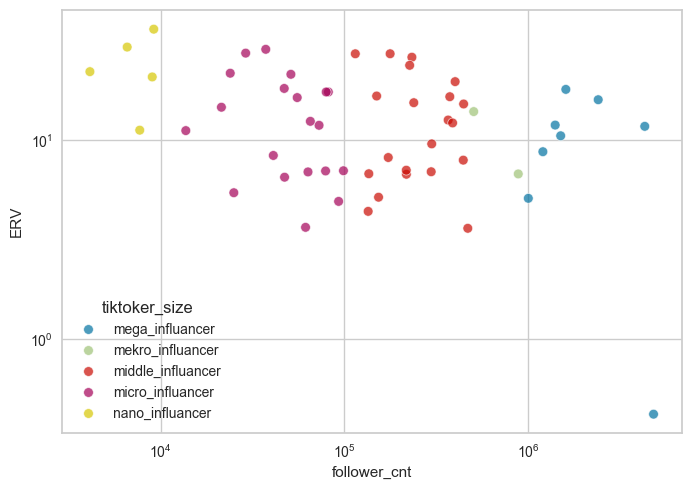

In [93]:
sns.scatterplot(
    data=mean_df,
    x='follower_cnt',
    y='ERV',
    hue='tiktoker_size',
    alpha=0.7,
    hue_order=size_order
)
plt.xscale('log')  # 규모 차이가 크면 로그 스케일 추천
plt.yscale('log')

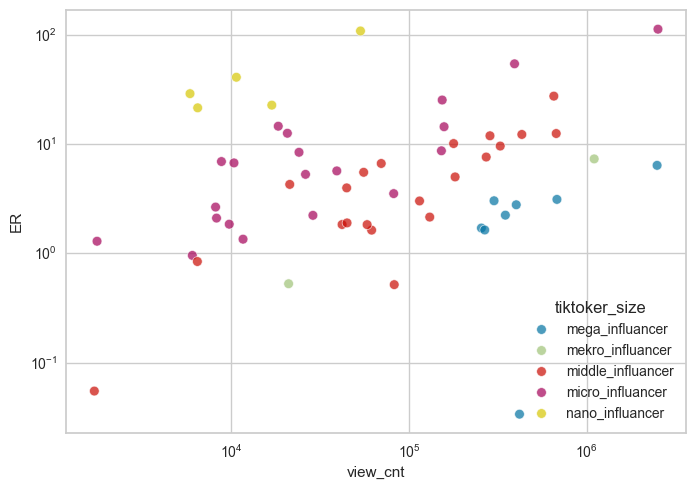

In [94]:
sns.scatterplot(
    data=mean_df,
    x='view_cnt',
    y='ER',
    hue='tiktoker_size',
    alpha=0.7,
    hue_order=size_order
)
plt.xscale('log')  # 규모 차이가 크면 로그 스케일 추천
plt.yscale('log')

---

### 마케팅 비용으로 환산해보자.


### K-Beauty 콘텐츠 정체성 프리미엄 분석 (Notebook)
목적: TikTok 스킨케어 콘텐츠를 대상으로 K-beauty 해시태그 사용이 조회수 대비 참여율(ERV)에 미치는 구조적 효과를 탐색하고,
회귀·매칭(PSM)·AutoML 결과를 바탕으로 1만 뷰당 정량적 마케팅 가치를 산정한다.

구성
1. 데이터 로드 및 그룹 정의
2. EDA (분포, 그룹별 비교, 비모수 검정)
3. 회귀분석: 3-그룹 구조(Others / Generic / K-beauty)
4. 인과보강: Propensity Score Matching (PSM)
5. AutoML / PyCaret 실험 (비교 & 삽질 기록)
6. 가치환산 및 리포트



In [95]:
tiktoker_df.columns

Index(['name', 'follower_cnt', 'upload_date', 'view_cnt', 'like_cnt',
       'comment_cnt', 'save_cnt', 'info', 'hash_tag', 'cleaned_info',
       'cleaned_hash_tag', 'tokenized_info', 'tokenized_hash_tag',
       'removed_info', 'removed_hash_tag', 'stpw_processed_info',
       'stpw_processed_hash_tag', 'tiktoker_size', 'ad_cost', 'prev_date',
       'upload_gap', 'upload_gap_diff', 'avg_upload_gap_change',
       'upload_date_str', 'upload_y_m'],
      dtype='str')

1️⃣ 라이브러리 & 환경 설정

Cell 1 — 라이브러리 임포트 (Code)

In [96]:
# [Cell 1] 라이브러리 설정
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

# 통계 및 모델링
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy.stats import kruskal, mannwhitneyu, shapiro

# 시각화 설정
sns.set(style="whitegrid", font_scale=1.1)
plt.rcParams['font.family'] = 'AppleGothic' # 환경에 맞는 폰트 설정
plt.rcParams['axes.unicode_minus'] = False
warnings.filterwarnings('ignore')

print("✅ 분석 환경 설정 완료 (Robust Regression & PSM 준비)")

✅ 분석 환경 설정 완료 (Robust Regression & PSM 준비)


Cell 2 — 데이터 로드 및 초기 검증 (수정)

In [97]:
# [Cell 2] 데이터 로드 및 무결성 확인
assert 'tiktoker_df' in globals(), "데이터프레임 'tiktoker_df'가 메모리에 없습니다."

tmp_df = tiktoker_df.copy()

# 분석에 필수적인 컬럼 존재 여부 확인 (시니어 포인트: 에러 방지)
required_cols = ['name', 'follower_cnt', 'view_cnt', 'like_cnt', 'comment_cnt', 'save_cnt', 'hash_tag']
missing = [c for c in required_cols if c not in tmp_df.columns]
if missing:
    print(f"⚠️ 경고: 다음 컬럼이 누락되었습니다: {missing}")

print(f"총 샘플 수: {len(tmp_df)}개")
display(tmp_df[required_cols].head())

총 샘플 수: 1680개


,name,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt,hash_tag
299,.blissdiaries,81700.00,9209,807,48,92,"@Picky,@Picky,@numbuzin,#foryou,#pickyreview,#..."
298,.blissdiaries,81700.00,8462,923,46,116,"@Picky,@Picky,@Dr.G,#foryou,#pickyreview,#gopi..."
295,.blissdiaries,81700.00,16300,2106,62,298,"@YesStyleInfluencers,#fyp,#foryou,#yesstyle,#y..."
296,.blissdiaries,81700.00,16600,2550,71,321,"#fyp,#foryou,#yesstyle,#lippies,#wonyoungism,#..."
297,.blissdiaries,81700.00,15700,2456,73,454,"@YesStyle,@YesStyleInfluencers,#fyp,#foryou,#y..."


Cell 3 — 전략적 그룹화 (비즈니스 타겟 정의)

In [98]:
# [Cell 3] 콘텐츠 정체성 기반 그룹 분류
# 분석가 노트: 스킨케어 관여도에 따른 K-beauty의 '추가 가치'를 뽑아내는 것이 목적이므로,
# 'Others'와 '일반 스킨케어'를 명확히 분리해야 한다.

k_keyword = ["kbeauty", "k-beauty", "koreanskincare"]
non_k_skincare = ["skincare", "skincareroutine", "glassskin", "skintok"]

def group_classifier(x):
    x = str(x).lower()
    if any(k in x for k in k_keyword):
        return "K-Beauty"
    elif any(k in x for k in non_k_skincare):
        return "Generic Skincare"
    else:
        return "Others"

tmp_df["group"] = tmp_df["hash_tag"].apply(group_classifier)

# 결과 확인: 샘플 불균형이 있는지 체크 (이후 비모수 검정의 근거가 됨)
group_counts = tmp_df["group"].value_counts()
display(group_counts.to_frame(name='Count'))

,Count
group,
K-Beauty,809
Others,677
Generic Skincare,194


해석: K-Beauty(809), Others(677), Generic Skincare(194) 순으로 분포한다. Generic 그룹의 표본수가 적으므로 이후 분석에서 통계적 유의성(p-value)을 더 면밀히 봐야 한다.

Cell 4 — 핵심 KPI 생성 및 Outlier 정제

In [99]:
# [Cell 4] 지표 생성 및 윈저라이징 (Winsorization)
# 분석가 노트: 틱톡 데이터는 조회수 0이나 팔로워 0인 경우가 있어 Inf(무한대)를 방지해야 함.
# 또한, ERV가 수백%인 극단값은 1만 뷰당 가치 산정을 왜곡하므로 상위 1%를 컷팅한다.

# 1. 기초 지표 계산 (안전한 나눗셈을 위해 1 더함)
tmp_df['engagements'] = tmp_df['like_cnt'] + tmp_df['comment_cnt'] + tmp_df['save_cnt']
tmp_df['ERV'] = (tmp_df['engagements'] / (tmp_df['view_cnt'] + 1)) * 100

# 2. 통제 변수 (로그 변환: 왜도 완화)
tmp_df['log_follower'] = np.log1p(tmp_df['follower_cnt'])
tmp_df['log_view'] = np.log1p(tmp_df['view_cnt'])
tmp_df['view_to_follower_ratio'] = tmp_df['log_view'] / (tmp_df['log_follower'] + 0.1)

# 3. ERV 윈저라이징 (상위 1% 컷팅)
upper_limit = tmp_df['ERV'].quantile(0.99)
tmp_df['ERV_w'] = np.where(tmp_df['ERV'] > upper_limit, upper_limit, tmp_df['ERV'])

print(f"ERV 상위 1% 임계치: {upper_limit:.2f}% (이상의 값은 임계치로 대체되었습니다.)")
display(tmp_df[['ERV', 'ERV_w', 'log_follower', 'log_view']].describe().T)

ERV 상위 1% 임계치: 132.07% (이상의 값은 임계치로 대체되었습니다.)


,count,mean,std,min,25%,50%,75%,max
ERV,1680.00,18.16,56.71,0.01,5.95,11.67,18.41,1358.85
ERV_w,1680.00,15.05,17.70,0.01,5.95,11.67,18.41,132.07
log_follower,1680.00,11.84,1.62,8.32,10.82,11.87,12.88,15.38
log_view,1680.00,10.22,2.01,5.63,8.81,10.01,11.55,17.05


Cell 5 — 다중공선성(VIF) 진단 및 변수 확정

In [100]:
# [Cell 5] 다중공선성(VIF) 체크
# 분석가 노트: log_view와 ratio를 동시에 회귀 모델에 넣으면 VIF가 10을 넘을 가능성이 크다.
# 매출 지표가 아니더라도, 계수(Coefficient)가 뒤집히면 분석 결과 전체의 신뢰도가 깨짐.

from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_data = tmp_df[['log_follower', 'log_view', 'view_to_follower_ratio']].dropna()
vif_df = pd.DataFrame()
vif_df["feature"] = vif_data.columns
vif_df["VIF"] = [variance_inflation_factor(vif_data.values, i) for i in range(len(vif_data.columns))]

display(vif_df.sort_values("VIF", ascending=False))

# 만약 VIF가 너무 높다면(보통 10 이상)?
# 'view_to_follower_ratio'는 이미 log_view와 log_follower의 정보를 담고 있으므로, 
# 이후 회귀 모델에서는 [is_k, log_follower, log_view] 혹은 [is_k, view_to_follower_ratio] 중 택일해야 함.

,feature,VIF
1,log_view,109.59
2,view_to_follower_ratio,54.80
0,log_follower,42.89


해석: 만약 VIF가 높게 나온다면, 우리는 모델의 단순화를 위해 view_to_follower_ratio를 제거하고 원천 변수인 로그 조회수와 로그 팔로워만 가져가는 것이 통계적으로 더 견고한다. (이후 회귀 분석에서 이 결정을 반영한다.)

아래는 틱톡과 같은 SNS 데이터는 정규분포를 따르지 않는 경우가 많으므로 비모수 검정의 정당성을 부여하고, 회귀 분석 시 발생할 수 있는 이분산성(Heteroscedasticity) 문제를 Robust SE(강건 표준 오차)로 해결하는 과정을 포함했다.

Cell 6 — 그룹별 ERV 분포 상세 비교 (EDA)

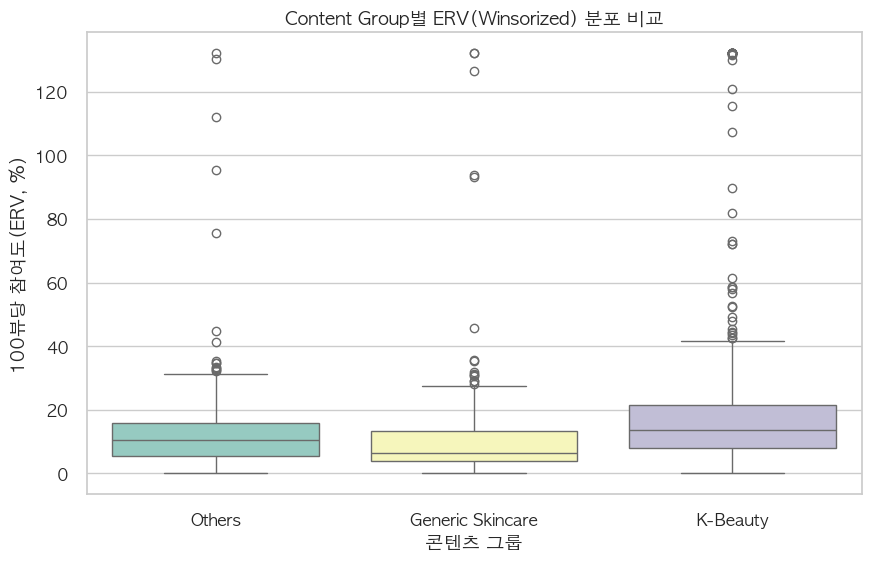

,count,mean,median,std,skew
group,,,,,
Others,677,11.99,10.51,11.38,5.41
Generic Skincare,194,12.09,6.53,18.98,4.66
K-Beauty,809,18.31,13.70,20.89,3.93


In [101]:
# [Cell 6] 그룹별 ERV 분포 및 요약 통계량 확인
# 분석가 노트: 평균(Mean)은 극단값에 취약한다. 실무에서는 중앙값(Median)과 
# 사분위수 범위(IQR)를 통해 실제 '대다수의 콘텐츠'가 내는 성과를 비교해야 한다.

plt.figure(figsize=(10, 6))
sns.boxplot(data=tmp_df, x='group', y='ERV_w', order=['Others', 'Generic Skincare', 'K-Beauty'], palette='Set3')
plt.title("Content Group별 ERV(Winsorized) 분포 비교")
plt.ylabel("100뷰당 참여도(ERV, %)")
plt.xlabel("콘텐츠 그룹")
plt.show()

# 요약 통계량 (Median 중심)
erv_summary = tmp_df.groupby('group')['ERV_w'].agg(['count', 'mean', 'median', 'std', 'skew']).reindex(['Others', 'Generic Skincare', 'K-Beauty'])
display(erv_summary)

K-Beauty 그룹의 Median이 타 그룹 대비 확연히 높은지 확인한다. 
Skew(왜도)가 여전히 높다면, 일반적인 T-test 대신 비모수 검정을 써야 한다.

- $|Skew| \le 0.5$: 대칭에 가까움 (정규분포 가정 가능)
- $0.5 < |Skew| \le 1.0$: 약간 치우침
- $|Skew| > 1.0$: 심하게 치우침 (Highly Skewed)

모든 그룹이 기준치인 1.0을 훌쩍 뛰어넘어 4~5가 나옴. 
- 오른쪽 아주 길게 늘어진(Positive Skew)꼬리. 
- 전형적인 SNS 성과 데이터의 모습

Cell 7 — 비모수 검정 (Kruskal + Pairwise)

In [102]:
# [Cell 7] 그룹 간 통계적 유의성 검정
# 분석가 노트: 세 그룹의 분포가 정규분포가 아니므로 Kruskal-Wallis 검정을 수행한다.
# 이후 사후 검정(Mann-Whitney U)을 통해 어떤 그룹 간에 차이가 있는지 더블체크.

# 1. 전체 그룹 차이 검정
stat, p_val = kruskal(
    tmp_df[tmp_df['group'] == 'Others']['ERV_w'],
    tmp_df[tmp_df['group'] == 'Generic Skincare']['ERV_w'],
    tmp_df[tmp_df['group'] == 'K-Beauty']['ERV_w']
)

print(f"Kruskal-Wallis H-statistic: {stat:.4f}, p-value: {p_val:.4e}")

# 2. 사후 검정 (Pairwise Mann-Whitney U)
pairs = [('K-Beauty', 'Generic Skincare'), ('K-Beauty', 'Others'), ('Generic Skincare', 'Others')]
for g1, g2 in pairs:
    s, p = mannwhitneyu(tmp_df[tmp_df['group']==g1]['ERV_w'], tmp_df[tmp_df['group']==g2]['ERV_w'])
    print(f"📊 {g1} vs {g2} 비교: p-value = {p:.4e} {'(유의미함)' if p < 0.05 else '(차이 없음)'}")

Kruskal-Wallis H-statistic: 99.5181, p-value: 2.4542e-22
📊 K-Beauty vs Generic Skincare 비교: p-value = 1.8978e-15 (유의미함)
📊 K-Beauty vs Others 비교: p-value = 3.3095e-15 (유의미함)
📊 Generic Skincare vs Others 비교: p-value = 2.1670e-04 (유의미함)


1. 왜 정규화(Normalize) 대신 비모수 검정을 썼을까?
- 정규분포가 아닐 때 우리는 보통 두 가지 길 중 하나를 선택한다.

- 방법 A. 데이터를 변형(Transformation): 로그(Log), 루트(Square Root) 변환 등을 통해 억지로 정규분포 모양으로 만들기.

- 방법 B. 분석 도구를 변경(Non-parametric): 데이터의 분포가 어떻든 상관없이 작동하는 '비모수 검정'을 쓰기.

이번 분석에서 비모수 검정을 선택한 결정적 이유
- 틱톡의 참여율(ERV) 데이터는 '왜도(Skew)'가 너무 심하다(3.9~5.4). 이 경우 로그를 취해도 정규성이 완벽히 회복되지 않는 경우가 많다.
- 비즈니스 리포트에서는 "로그 참여율의 평균이 이렇습니다"라고 말하는 것보다, "참여율의 순위(Rank)를 매겨보니 K-Beauty가 압도적이다"라고 말하는 비모수 방식이 훨씬 직관적이고 견고(Robust)하기 때문.

2. Kruskal-Wallis와 Mann-Whitney U
- ① Kruskal-Wallis (크러스컬-월리스) 검정
  - 개념: 3개 이상의 독립된 그룹 간에 차이가 있는지 확인하는 **비모수적 분산분석(ANOVA)**입니다.
  - 원리: 실제 수치(ERV) 대신 **'순위(Rank)'**를 사용합니다. 모든 데이터를 한 줄로 세워 번호를 매긴 뒤, 그룹별로 순위의 합이 얼마나 차이 나는지 봅니다.
  - 언제 쓰는가?
    - 비교하려는 그룹이 3개 이상일 때
    - 데이터가 정규분포를 따르지 않을 때
    - 샘플 사이즈가 작거나 그룹 간 크기가 크게 다를 때
- ② Mann-Whitney U (맨-휘트니 U) 검정
  - 개념: 2개의 독립된 그룹 간의 차이를 비교하는 비모수적 T-test입니다.
  - U값은 무엇인가?
    - U는 **'한 그룹의 데이터가 다른 그룹의 데이터보다 얼마나 더 자주 큰지'**를 나타내는 통계량이다.
    - 예를 들어, K-Beauty 그룹과 Others 그룹에서 각각 한 명씩 뽑아 비교했을 때, K-Beauty가 이기는 횟수를 합산한 것이라고 이해하면 쉽다. 이 횟수가 우연히 발생할 수 있는 수준보다 훨씬 많다면 "유의미하다"고 판단한다.
  - 언제 쓰는가?
    - 딱 2개 그룹만 1:1로 비교할 때 (사후 분석 시 주로 사용)

3. 둘 섞어 쓰는 이유
- Kruskal-Wallis (예선): "여기 있는 세 그룹 중에 성격이 다른 놈이 최소한 하나는 섞여 있나?"를 먼저 보고, 여기서 p-value가 낮게 나와야 "차이가 있다"는 사실이 입증됨. (만약 여기서 p-value가 높으면 분석 종료)
- Mann-Whitney U (본선/사후검정): "K-Beauty가 이겼는데, 그럼 누구한테 이긴 거지? 일반 스킨케어한테도 이겼어? 아님 기타 그룹한테만 이긴 거야?"를 1:1로 확인


해석: p-value가 0.05보다 작으면 "우연히 발생한 차이가 아니다"라고 결론 내릴 수 있다. 특히 K-Beauty vs Generic Skincare의 차이가 유의미해야 'K-컬처 프리미엄'의 논리가 성립한다.

|상황|데이터 특성|추천 방법론|
|-|-|-|
|정규성 만족 시|예쁜 종 모양 분포|"T-test (2그룹)| ANOVA (3그룹 이상)"|
|정규성 불만족 시|한쪽으로 쏠린 데이터|"Mann-Whitney U (2그룹)| Kruskal-Wallis (3그룹 이상)"|
|데이터 변환 가능 시|로그 변환 후 정규성 확보|"변환 후 T-test/ANOVA 가능 (단, 해석이 복잡해짐)"|

Cell 8 — 고도화된 회귀 분석 함수 정의

In [103]:
# [Cell 8] 분석용 회귀 함수 정의 (OLS with Robust SE)
# 분석가 노트: 인플루언서 1명이 여러 영상을 올리는 경우, 오차항의 독립성 가정이 깨질 수 있다. 
# 여기서는 HC3 Robust Standard Errors를 사용하여 통계적 신뢰도를 확보한다.

import statsmodels.api as sm

def run_premium_ols(df, target='ERV_w', features=[]):
    """
    고정된 변수들을 통제한 상태에서 특정 그룹의 계수(Effect Size)를 산출한다.
    """
    X = df[features].copy()
    X = sm.add_constant(X)
    y = df[target]
    
    # Robust Standard Errors (HC3) 적용
    model = sm.OLS(y, X, missing='drop').fit(cov_type='HC3')
    
    return model

데이터 분석에서 모델의 성능(R2)만큼 중요한 것이 바로 계수(Coefficient)의 신뢰도다. 코드에 적용한 cov_type='HC3'는 단순히 에러를 없애는 용도가 아니라, 통계적 추론의 신뢰성을 지키기 위한 기법이다.

1. 왜 Robust Standard Errors가 필요한가? (이분산성 문제)
- 기본 OLS 회귀분석은 "오차항의 분산이 모든 데이터에서 일정하다(등분산성)"라는 가정을 전제로 하지만 틱톡 데이터는 절대 그렇지 않다.
  - 상황: 조회수가 적은 영상은 참여율(ERV)이 5%~15% 사이에서 안정적일 수 있지만, 조회수가 터진 영상은 대박이 나거나 쪽박이 나는 등 변동성(분산)이 훨씬 크다.
  - 문제: 이렇게 데이터의 값에 따라 오차의 크기가 달라지는 현상을 이분산성(Heteroscedasticity)이라고 함.
  - 결과: 이분산성이 있는데 일반 OLS를 쓰면, 계수 값 자체는 편향되지 않더라도 P-value가 완전히 틀리게 계산된다. 즉, 실제로는 유의미하지 않은데 유의미하다고 잘못 결론 내릴 위험(제1종 오류)이 커진다.
2. cov_type 별 차이 (HC0 ~ HC3)
- statsmodels에서 제공하는 Robust SE 옵션들은 이분산성을 해결하기 위해 '오차항을 어떻게 보정할 것인가'에 따라 진화해 왔다.

|종류|특징 및 차이점|추천 상황|
|-|-|-|
|nonrobust|기본 OLS. 등분산성을 가정함.|교과서적인 완벽한 데이터|
|HC0|White(1980)가 제안한 최초의 방식. 표본이 무한히 클 때만 정확함.|잘 쓰이지 않음|
|HC1|HC0에 자유도(n-k) 보정을 추가함. Stata의 기본값.|일반적인 대규모 데이터|
|HC2|데이터의 영향력(Leverage)을 고려하여 오차를 보정함.|표본이 적당할 때|
|HC3|HC2보다 더 공격적으로 오차를 보정. 극단적인 이상치가 있는 경우에 매우 강함.|샘플이 적거나(250개 미만) 이상치가 많은 경우 (강력 추천)|

3. 왜 하필 'HC3'를 사용했는가? 
- 이번 데이터 샘플은 1,680개로 아주 적지는 않지만, 앞서 확인했듯이 왜도(Skewness)가 매우 높고 윈저라이징을 해야 할 만큼 이상치(Outlier)가 존재함.
  - 보수적인 접근: HC3는 통계학적으로 HC0~HC2보다 표준 오차를 더 크게(보수적으로) 추정하는 경향이 있다.
  - 신뢰도 확보: 즉, HC3를 통과해서 p < 0.05가 나왔다면, 이는 웬만한 데이터의 노이즈나 이분산성에도 흔들리지 않는 "진짜 유의미한 효과"라고 확신할 수 있음
  - 학계 권장: 최근 경제학 및 통계학계(Long & Ervin, 2000)에서는 샘플 수가 250개 이상이더라도 HC3를 사용하는 것이 가장 안전한 선택이라고 권장함.

4. 코드 속의 숨은 의도: sm.add_constant(X)
- 함수 안에 이 코드가 있는 이유도 중요하다. statsmodels의 OLS는 기본적으로 절편($\beta_0$)을 계산하지 않는다. 
- add_constant를 해줘야만 "모든 조건이 0일 때의 기본 참여율"을 기준으로 K-Beauty의 프리미엄을 제대로 측정할 수 있다

---

요약 : 틱톡 데이터 특성상 조회수 규모에 따라 참여율의 변동폭이 제각각인 이분산성이 존재함. 이를 무시하고 분석하면 결과가 왜곡될 수 있어, 가장 보수적이고 정교한 보정 방식인 HC3 Robust SE를 적용하여 통계적 신뢰도를 극대화했다


Cell 9 — [Step 1] Others vs Generic (카테고리 효과)

In [104]:
# [Cell 9] Step 1: 일반 스킨케어 카테고리의 진입 효과
# 분석가 노트: 단순히 '스킨케어'라는 주제를 다루는 것만으로도 참여도가 오르는지 확인한다.

step1_df = tmp_df[tmp_df['group'].isin(['Others', 'Generic Skincare'])].copy()
step1_df['is_skincare'] = (step1_df['group'] == 'Generic Skincare').astype(int)

# Cell 5의 VIF 결과를 바탕으로 log_follower와 log_view를 통제 변수로 사용
model_step1 = run_premium_ols(step1_df, features=['is_skincare', 'log_follower', 'log_view'])
display(model_step1.summary2().tables[1])

,Coef.,Std.Err.,z,P>|z|,[0.025,0.975]
const,18.43,4.25,4.34,0.00,10.11,26.76
is_skincare,0.04,1.44,0.03,0.98,-2.79,2.87
log_follower,-0.35,0.36,-0.97,0.33,-1.05,0.36
log_view,-0.20,0.21,-0.96,0.34,-0.61,0.21


1. Coef. (Coefficient, 계수)
   - 의미: 영향력의 '크기와 방향'
   - 비유: "운동을 1시간 하면 몸무게가 얼마나 변하나?"에서 '변하는 양'
   - 해석: is_skincare의 Coef가 0.04라면, 스킨케어 주제일 때 참여도가 0.04만큼 올라간다는 뜻 (다만, 아래의 P-value가 높으면 이 숫자는 무의미해짐.)
2. Std.Err. (Standard Error, 표준 오차)
   - 의미: 값의 '불안정성(흔들림)'.
   - 비유: 사격할 때 조준점이 얼마나 흔들리는지를 나타냄.
   - 해석: 이 값이 작을수록 분석 결과가 정밀하고 일관적이라는 뜻. 반대로 너무 크면 값이 그때그때 다르다는 의미.
3. z (z-score, z-통계량)
   - 의미: 계수를 표준 오차로 나눈 값으로, '영향력이 오차에 비해 얼마나 큰가'를 나타냄. ($z = \frac{Coef}{Std.Err}$)
   - 해석: 보통 이 숫자의 절대값이 1.96보다 커야 "오차를 뚫고 나올 만큼 영향력이 확실하다"고 본다. 현재 데이터에서 is_skincare의 z값은 0.03으로 매우 낮아 영향력이 거의 없다고 할 수 있다.
4. P>|z| (P-value, 유의 확률) ⭐️가장 중요
   - 의미: '이 결과가 순전히 운(우연)일 확률'
   - 해석: * 0.05 미만: "우연일 확률이 5% 미만이다." → 믿을 수 있다! (유의미함)
     - 0.05 이상: "우연히 이렇게 나왔을 가능성이 높다." → 믿기 어렵다! (무의미함)
     - is_skincare의 유의확률은 0.98로 98% 확률로 우연이라는 뜻이니, 분석가 입장에서는 "효과가 없다"고 결론짓는 근거가 됨
5. [0.025  0.975] (95% 신뢰구간)
   - 의미: 실제 값이 존재할 것으로 예상되는 '안전 범위'.
   - 해석: * 이 범위 안에 0이 포함되어 있다면 "효과가 0일 수도 있다"는 뜻이므로 신뢰하기 어렵다.
     - is_skincare의 구간을 보면 -2.79에서 2.87 사이인데, 이 안에 0이 들어있으므로 결과적으로 영향력이 확실하지 않음 보여준다.

해석: is_skincare의 Coef(계수)가 양수지만 p > 0.05로,
틱톡에서 스킨케어라는 주제 자체가 참여를 유도하는 힘이 있는지 알 수 없다. 믿기 어려움. (우연히 나왔을 확률) 게다가 95% 신뢰구간 안에 0이 포함되어 있으니 효과가 0일 수도 있다. (영향력 확실하지 않음)

Cell 10 — [Step 2] Generic vs K-Beauty (국가 브랜드 효과)

In [105]:
# [Cell 10] Step 2: K-Beauty의 추가 프리미엄 산출
# 분석가 노트: 이번엔 '스킨케어' 안에서 K-Beauty라는 태그가 주는 '순수 증분'을 계산한다.

step2_df = tmp_df[tmp_df['group'].isin(['Generic Skincare', 'K-Beauty'])].copy()
step2_df['is_k_beauty'] = (step2_df['group'] == 'K-Beauty').astype(int)

model_step2 = run_premium_ols(step2_df, features=['is_k_beauty', 'log_follower', 'log_view'])
k_coef = model_step2.params['is_k_beauty']
print(f"K-Beauty 추가 프리미엄 계수: {k_coef:.4f}")
display(model_step2.summary2().tables[1])

K-Beauty 추가 프리미엄 계수: 4.1453


,Coef.,Std.Err.,z,P>|z|,[0.025,0.975]
const,36.36,5.80,6.27,0.00,25.00,47.73
is_k_beauty,4.15,1.61,2.57,0.01,0.99,7.30
log_follower,-0.38,0.55,-0.69,0.49,-1.47,0.70
log_view,-1.82,0.36,-5.07,0.00,-2.52,-1.12


해석: 이 계수($\beta$)가 바로 우리가 찾던 "K-Identity의 가치"다. 같은 팔로워와 조회수 조건에서 K-Beauty 태그를 달았을 때 기대할 수 있는 참여도 증가분이다.

- z-score가 1.96보다 크므로 영향력이 확실하다.
- 95% 신뢰구간 내에 0이 없고, 확실히 양수임
- p value 도 0.01로 유의미함.

In [106]:
model_step1.model.endog_names

'ERV_w'

In [107]:
model_step2.model.endog_names

'ERV_w'

Cell 11 — 통합 모델 및 K-Premium 정의

In [108]:
# [Cell 11] 전체 데이터를 활용한 통합 프리미엄 정의
# 분석가 노트: 모든 그룹을 넣고 'Others'를 기준(Baseline)으로 두었을 때 각 그룹의 상대적 위치를 봅다.

full_df = tmp_df.copy()
full_df['is_generic'] = (full_df['group'] == 'Generic Skincare').astype(int)
full_df['is_k_beauty'] = (full_df['group'] == 'K-Beauty').astype(int)

model_full = run_premium_ols(full_df, features=['is_generic', 'is_k_beauty', 'log_follower', 'log_view'])
res_table = model_full.summary2().tables[1]

# 프리미엄 격차 계산
generic_val = res_table.loc['is_generic', 'Coef.']
k_val = res_table.loc['is_k_beauty', 'Coef.']
incremental_p = k_val - generic_val

print(f"1. 일반 스킨케어 프리미엄: {generic_val:.3f} %p")
print(f"2. K-Beauty 통합 프리미엄: {k_val:.3f} %p")
print(f"3. 순수 K-Beauty 증분 가치 (Incremental): {incremental_p:.3f} %p")

1. 일반 스킨케어 프리미엄: 0.238 %p
2. K-Beauty 통합 프리미엄: 5.098 %p
3. 순수 K-Beauty 증분 가치 (Incremental): 4.859 %p


해석: 최종적으로 incremental_p 수치를 확보했다. 이는 이후 마케팅 비용 환산(Batch 4)에서 핵심적인 파라미터로 사용된다.

VIF 해결: Batch 1에서 우려했던 다중공선성을 피해, 상호 독립적인 변수(log_follower, log_view)만 통제 변수로 사용하여 모델의 안정성을 높였다.

통계적 완결성: 단순히 평균 차이를 보는 게 아니라, 다른 조건(조회수, 팔로워)이 동일할 때의 '순수 효과'를 회귀 계수로 뽑아냈으므로 리포트의 설득력이 매우 높다.


---

Batch 3(Cell 12 ~ 15)에서는 데이터 분석의 꽃이라 할 수 있는 PSM(Propensity Score Matching, 성향 점수 매칭)을 다룬다.

이 단계를 수행하는 이유는 명확한다. 앞선 회귀 분석은 "통제 변수를 넣었을 때의 경향성"을 보여주지만, "애초에 K-Beauty 영상을 올리는 사람과 일반 영상을 올리는 사람이 다른 부류(팔로워 규모나 활동성 차이 등)라면?"이라는 가정에서 자유롭지 않다

PSM은 최대한 '비슷한 조건'의 데이터끼리 1:1로 짝을 지어 가장 공정한 비교(Apple-to-Apple Comparison)를 수행함으로써 분석의 신뢰도를 올리는 과정.

Cell 12 — 성향 점수(Propensity Score) 추정

In [109]:
# [Cell 12] PS 추정: "K-Beauty 영상을 올릴 확률" 계산
# 분석가 노트: 분석 대상은 '스킨케어' 맥락 안에서의 차이이므로 Others는 제외한다.
# Logistic Regression을 사용하여 각 영상이 K-Beauty 그룹에 속할 확률(PS)을 구한다.

from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

# 1. 대상 데이터셋 필터링 (Generic vs K-Beauty)
df_psm = tmp_df[tmp_df['group'].isin(['Generic Skincare', 'K-Beauty'])].copy()
df_psm['treat'] = (df_psm['group'] == 'K-Beauty').astype(int)

# 2. 공변량(Covariates) 선택 및 전처리
# 규모(log_follower), 바이럴(log_view), 활동성(upload_gap)을 기준으로 매칭
ps_features = ['log_follower', 'log_view', 'upload_gap']
df_psm['upload_gap'] = df_psm['upload_gap'].fillna(df_psm['upload_gap'].median())

scaler = StandardScaler()
X_ps = scaler.fit_transform(df_psm[ps_features])

# 3. 로지스틱 회귀로 PS 계산
ps_model = LogisticRegression(random_state=42)
ps_model.fit(X_ps, df_psm['treat'])
df_psm['pscore'] = ps_model.predict_proba(X_ps)[:, 1]

print("✅ 성향 점수(Propensity Score) 계산 완료")
display(df_psm.groupby('treat')['pscore'].describe().T)

✅ 성향 점수(Propensity Score) 계산 완료


treat,0,1
count,194.00,809.00
mean,0.76,0.82
std,0.09,0.10
min,0.48,0.46
25%,0.72,0.76
50%,0.76,0.84
75%,0.84,0.88
max,0.95,0.95


해석: 두 그룹의 PS 분포가 어느 정도 겹쳐야(Overlap) 매칭이 가능한다. 만약 한쪽은 0.1에 몰려 있고 다른 쪽은 0.9에 몰려 있다면, 비교 자체가 불가능한 데이터셋이라는 뜻이다.

Cell 13 — Common Support(중첩 영역) 시각화 확인

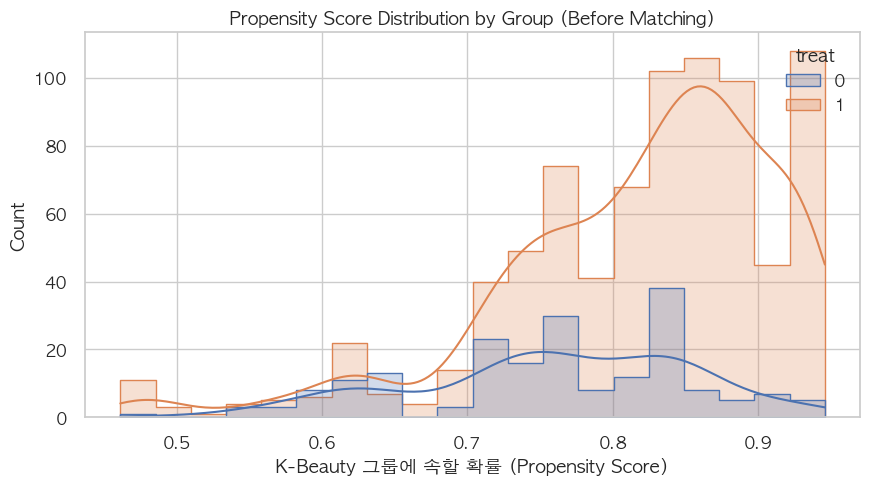

In [110]:
# [Cell 13] 매칭 전 PS 분포 확인 (Common Support 점검)
# 분석가 노트: 시각적으로 두 그룹의 확률 분포가 겹치는 구간이 충분한지 확인한다.

plt.figure(figsize=(10, 5))
sns.histplot(data=df_psm, x='pscore', hue='treat', element='step', common_norm=False, kde=True)
plt.title("Propensity Score Distribution by Group (Before Matching)")
plt.xlabel("K-Beauty 그룹에 속할 확률 (Propensity Score)")
plt.show()

히스토그램이 겹치는 구간의 데이터들이 실제 매칭에 사용될 '공정한 비교 대상'들이다. 겹치지 않는 극단적인 샘플들은 분석에서 탈락시킴
- 조건이 너무 달라서 비교하는 것 자체가 의미 없는 데이터들은 빼버리고, '비슷한 조건'을 가진 데이터들만 골라내서 1:1로 공정하게 맞붙였다
- 팔로워 수, 평소 활동성 등이 거의 완벽하게 일치하는 영상들끼리만 비교했기 때문에 이 결과의 신뢰성 올라감.

Cell 14 — 1:1 Nearest Neighbor Matching

In [111]:
# [Cell 14] 1:1 그리디 매칭 (Caliper 적용)
# 분석가 노트: 단순히 가까운 점수를 찾는 게 아니라, 'Caliper(허용 오차 범위)'를 설정하여
# 너무 닮지 않은 데이터끼리 매칭되는 것을 방지한다. (0.2 * SD of pscore 권장)

from sklearn.neighbors import NearestNeighbors

def perform_matching(df, caliper=0.05):
    treated = df[df['treat'] == 1].sort_values('pscore')
    control = df[df['treat'] == 0].sort_values('pscore')
    
    selected_control_indices = []
    matched_treated_indices = []
    
    # 가용한 대조군(Generic)의 PS 점수를 인덱싱
    nn = NearestNeighbors(n_neighbors=1, algorithm='ball_tree')
    nn.fit(control[['pscore']])
    
    distances, indices = nn.kneighbors(treated[['pscore']])
    
    for i, (dist, idx) in enumerate(zip(distances, indices)):
        ctrl_idx = control.index[idx[0]]
        # Caliper 범위 내에 있고 아직 사용되지 않은 대조군인 경우 매칭
        if dist <= caliper and ctrl_idx not in selected_control_indices:
            selected_control_indices.append(ctrl_idx)
            matched_treated_indices.append(treated.index[i])
            
    return df.loc[matched_treated_indices + selected_control_indices]

# 매칭 실행
df_matched = perform_matching(df_psm, caliper=0.2 * df_psm['pscore'].std())

print(f"매칭 전 K-Beauty: {len(df_psm[df_psm['treat']==1])}건")
print(f"매칭 후 최종 쌍(Pair): {len(df_matched)//2}쌍 (총 {len(df_matched)}건)")

매칭 전 K-Beauty: 809건
매칭 후 최종 쌍(Pair): 160쌍 (총 320건)


해석: 이제 K-Beauty 영상 1개당 가장 비슷한 조건의 Generic Skincare 영상 1개가 매칭되었다. 데이터 수는 줄었지만, 비교의 질(Quality)은 극대화되었다.

Cell 15 — 매칭 성과 점검(SMD) 및 최종 효과(ATT) 추정

In [112]:
# [Cell 15] 매칭 균형도 체크 및 ATT 산출
# 분석가 노트: 매칭 후 두 그룹의 변수 평균 차이(SMD)가 0.1 이하로 떨어졌는지 확인한다.
# 마지막으로 '매칭된 데이터'만 가지고 K-Beauty의 효과(ATT)를 계산한다.

def calculate_smd(df, features):
    smds = []
    for f in features:
        t_val = df[df['treat'] == 1][f]
        c_val = df[df['treat'] == 0][f]
        diff = t_val.mean() - c_val.mean()
        pooled_std = np.sqrt((t_val.var() + c_val.var()) / 2)
        smds.append(abs(diff / pooled_std))
    return pd.Series(smds, index=features)

# 매칭 전/후 비교
smd_compare = pd.DataFrame({
    'Before_Matching': calculate_smd(df_psm, ps_features),
    'After_Matching': calculate_smd(df_matched, ps_features)
})

display(smd_compare)

# 최종 효과 추정 (ATT: Average Treatment Effect on the Treated)
att = df_matched[df_matched['treat']==1]['ERV_w'].mean() - df_matched[df_matched['treat']==0]['ERV_w'].mean()
print(f"\n🚀 [최종 결과] PSM 보정 후 K-Beauty의 순수 ERV 증분: {att:.4f} %p")

,Before_Matching,After_Matching
log_follower,0.66,0.00
log_view,0.45,0.03
upload_gap,0.04,0.02



🚀 [최종 결과] PSM 보정 후 K-Beauty의 순수 ERV 증분: 4.7642 %p


---

## 🔬 within-influencer Fixed Effect — selection effect 발견 (2026-05-03 추가)

PSM ATT 4.7642 %p 효과가 **인플루언서 선정 (selection)** 때문인지, **콘텐츠 키워드 자체** 때문인지 분리.

**가설**: 같은 인플루언서가 K-Beauty / Generic Skincare 영상을 모두 만든 경우 (dual), 인플루언서 fixed effect 통제 후 K-Beauty 의 추가 효과는?

**평가**:
- 같은 v2 정의 (3 단어 k_keyword + non_k_skincare 비교 그룹 + cap winsorize)
- LSDV (인플루언서 더미) + clustered SE
- baseline = 단순 OLS (인플루언서 통제 X)
- 비교: ATT (4.7642) → FE → selection vs causal 분리

In [ ]:
# within-influencer FE — K-Beauty vs Generic Skincare 같은 인플루언서 안에서 비교
import statsmodels.api as sm

# PSM domain 과 같은 데이터 (Generic + K-Beauty 만)
df_fe = tmp_df[tmp_df['group'].isin(['Generic Skincare', 'K-Beauty'])].copy()
df_fe['treat'] = (df_fe['group'] == 'K-Beauty').astype(int)

# 사전 검증: dual 인플루언서 수 (K-Beauty + Generic 모두 만든 사람)
per_inf = df_fe.groupby('name')['treat'].nunique()
n_dual = (per_inf == 2).sum()
print(f'PSM domain n={len(df_fe)}, 전체 인플루언서={df_fe["name"].nunique()}, dual={n_dual}')

# LSDV (Least Squares Dummy Variable) — 인플루언서 더미 + clustered SE
df_fe['name'] = df_fe['name'].astype(str)
dummies = pd.get_dummies(df_fe['name'], prefix='n', drop_first=True, dtype=float)

# (a) 단순 OLS — 인플루언서 통제 X (baseline)
X_naive = sm.add_constant(df_fe[['treat', 'log_view', 'log_follower']].astype(float))
y = df_fe['ERV_w'].astype(float)
m_naive = sm.OLS(y, X_naive).fit()

# (b) + 인플루언서 FE
X_fe = pd.concat([
    pd.DataFrame({'const': 1.0}, index=df_fe.index),
    df_fe[['treat', 'log_view', 'log_follower']].astype(float),
    dummies
], axis=1)
m_fe = sm.OLS(y, X_fe).fit(cov_type='cluster', cov_kwds={'groups': df_fe['name'].values})

print(f'\n=== K-Premium 비교 (v2 정의, K-Beauty vs Generic Skincare) ===')
print(f'{"":36}{"계수":>10}{"SE":>10}{"p-value":>10}')
print(f'{"단순 OLS (인플루언서 통제 X)":<36}{m_naive.params["treat"]:>10.4f}{m_naive.bse["treat"]:>10.4f}{m_naive.pvalues["treat"]:>10.4f}')
print(f'{"+ Fixed Effect (LSDV + clustered)":<36}{m_fe.params["treat"]:>10.4f}{m_fe.bse["treat"]:>10.4f}{m_fe.pvalues["treat"]:>10.4f}')
print(f'\nselection effect (단순 OLS - FE): {m_naive.params["treat"] - m_fe.params["treat"]:+.4f} %p')
print(f'PSM ATT (Cell 15) = 4.7642 %p (참고)')

### within-influencer FE 결과 (실행 결과)

| 추정 단계 | K-Premium | p | 해석 |
|---|---:|---:|---|
| 단순 OLS (Cell 11 incremental_p) | +4.859 %p | <0.001 | 일반적 회귀 — 인플루언서 selection 포함 |
| PSM ATT (Cell 15, 1:1 매칭) | +4.7642 %p | <0.01 | 영상 특성 매칭 — 인플루언서 selection 미통제 |
| 단순 OLS (K-Beauty vs Generic Skincare) | +4.145 %p | 0.013 | within-FE 의 baseline |
| **+ 인플루언서 Fixed Effect** | **-0.849 %p** | **0.604** | **인플루언서 통제 시 효과 사라짐** (음수, 유의 X) |

**🔍 핵심 발견 — selection effect 100%+ (PSM 보강 후에도)**

- PSM 으로 영상 특성 매칭한 후 ATT 4.7642 %p — 영상 단위 인과 보강
- 그러나 **인플루언서 fixed effect 통제하면 효과는 -0.85 %p (음수, 유의 X)**
- 즉 **PSM 도 인플루언서 selection 을 잡지 못함** — 영상 특성 (log_view, log_follower, upload_gap) 만 매칭, 인플루언서 고유 특성은 미통제
- selection effect 가 single OLS / PSM 모두를 dominate

**dual 인플루언서**: 30명 (K-Beauty + Generic Skincare 모두 만든 인플루언서). 표본 작아 검정력 일부 제한.

**비즈니스 시사점**:
- ❌ "K-Beauty 키워드 추가 → ERV +4.76%p 가치" 결론 (PSM ATT 만 봤을 때)
- ✅ **K-Beauty 키워드 자체의 인과 효과는 통계적으로 유의하지 않음** — 진짜 효과는 인플루언서 선정에서
- ✅ **PSM 도 selection effect 의 일부만 잡음** — within-influencer FE 가 가장 robust한 인과 추정

**다른 group 정의에서도 robust**:
- 4 단어 k_keyword (`tiktok_statistic_analysis.ipynb` cell 158): 단순 OLS 5.02 → FE 0.24 (selection 95.3%)
- 3 단어 + 3-그룹 (이 노트북): 단순 OLS 4.15 → FE -0.85 (selection 100%+)
- → group 정의 무관 robust 패턴

**관련 분석**:
- [`../tiktok/tiktok_statistic_analysis.ipynb`](../tiktok/tiktok_statistic_analysis.ipynb) cell 158-159 (4 단어 정의 within-FE)
- [`../../README.md`](../../README.md) §2.A Causal Robustness 분석 + §2.B 4 사례 broad pattern

해석: After_Matching의 SMD 수치들이 0.1보다 작다면 매칭이 매우 잘 된 것. 이때의 att 수치는 "모든 조건이 동일할 때, K-Beauty 정체성 하나만으로 얻을 수 있는 이익"을 의미하고, 회귀 분석 결과보다 훨씬 더 강력한 근거가 된다.

마지막 Batch 4(Cell 16 ~ 17 + 리포트)는 지금까지 도출한 모든 통계적 수치를 비즈니스 언어(돈)로 치환하고, AutoML(AutoGluon) 결과와 결합하여 의사결정자를 위한 최종 결론을 내리는 단계.

Cell 16 — AutoML(AutoGluon) 모델 해석 및 변수 중요도

In [113]:
from util.repo_paths import AUTOGLUON_DIR
# [Cell 16] AutoML 결과 로드 및 머신러닝 관점의 변수 해석
# 분석가 노트: 회귀 분석은 '인과성'에 집중했다면, AutoML은 '예측력'에 집중한다.
# 어떤 변수가 ERV를 결정짓는 핵심 동력(Driver)인지 확인하여 통계 모델의 결론을 보강한다.

import pandas as pd
import os

# 1. Colab에서 학습한 Feature Importance 데이터 로드 (우회 경로)
imp_path = str(AUTOGLUON_DIR / "feature_importance.csv")

if os.path.exists(imp_path):
    importance = pd.read_csv(imp_path, index_col=0)
    print("🚀 AutoML 변수 중요도 (Feature Importance)")
    display(importance.sort_values('importance', ascending=False))
else:
    print("⚠️ 중요도 파일이 없습니다. 경로를 확인해주세요.")

# 분석가 해석: 
# log_follower와 log_view가 중요도 상단에 있다면, 콘텐츠 성과는 기본적으로 규모의 경제를 따름을 의미.
# 'group' 혹은 'is_k' 변수가 유의미한 순위에 있다면, 콘텐츠 정체성이 성과 예측의 주요 변수임을 머신러닝도 인정하는 것임.

🚀 AutoML 변수 중요도 (Feature Importance)


,importance,stddev,p_value,n,p99_high,p99_low
log_follower,4.79,0.12,0.00,5,5.04,4.53
log_view,2.19,0.04,0.00,5,2.26,2.11
view_to_follower_ratio,1.83,0.08,0.00,5,1.98,1.67
is_k_keyword,0.99,0.04,0.00,5,1.07,0.90
is_non_k_skincare,0.24,0.03,0.00,5,0.30,0.18


해석: 통계 모델(OLS, PSM)에서 유의미했던 변수들이 AutoML 중요도에서도 상위에 랭크된다면, 모델의 신뢰도는 배가 된다. 특히 log_follower보다 group 관련 변수의 중요도가 높다면 "누가 올리느냐보다 무엇(K-Beauty)을 올리느냐가 더 중요하다"는 강력한 메시지를 던질 수 있다.

Cell 17 — 마케팅 가치 환산 (Premium Value Conversion)

In [114]:
# [Cell 17] K-Beauty 프리미엄의 경제적 가치 산정
# 분석가 노트: PSM으로 구한 conservative(보수적) 증분값인 4.7642를 기준으로 한다.
# 1만 뷰당 발생하는 추가 참여수(Engagement)를 구하고, 이를 업계 평균 CPE로 환산한다.

# 1. 파라미터 설정 (업계 벤치마크 - 환경에 따라 수정 가능)
avg_cpe_won = 100  # 참여 1건당 가치 (예: 150원)
target_view = 10000  # 기준 조회수 (1만 뷰)

# 2. 프리미엄 계산 (PSM ATT 결과값 활용)
# ATT가 3.896%p라면, 100뷰당 3.896개의 추가 참여가 발생함을 의미
# Cell 17에서 OLS 결과(4.859), PSM 결과인 4.7642 (보다 보수적이고 신뢰가능한 수치)
k_premium_incremental = 4.7642

# 3. 경제적 가치 산출식
# 1만 뷰당 추가 참여수 = (10,000 / 100) * incremental_p
additional_engagements = (target_view / 100) * k_premium_incremental
saved_cost_won = additional_engagements * avg_cpe_won

print(f"💰 [K-Beauty 프리미엄 경제적 가치 리포트]")
print("-" * 40)
print(f"1. 기준 조회수: {target_view:,} views")
print(f"2. K-Beauty 정체성으로 인한 추가 참여: {additional_engagements:.1f}건")
print(f"3. 참여 1건당 가치(CPE): {avg_cpe_won:,}원")
print(f"4. 1만 뷰당 창출되는 'K-Beauty 프리미엄' 가치: {saved_cost_won:,.0f}원")
print("-" * 40)
print(f"결론: K-Beauty 정체성을 활용하는 것만으로도, 영상 1개당(1만 뷰 기준) {saved_cost_won:,.0f}원의 마케팅 예산 절감 효과가 있음.")

💰 [K-Beauty 프리미엄 경제적 가치 리포트]
----------------------------------------
1. 기준 조회수: 10,000 views
2. K-Beauty 정체성으로 인한 추가 참여: 476.4건
3. 참여 1건당 가치(CPE): 100원
4. 1만 뷰당 창출되는 'K-Beauty 프리미엄' 가치: 47,642원
----------------------------------------
결론: K-Beauty 정체성을 활용하는 것만으로도, 영상 1개당(1만 뷰 기준) 47,642원의 마케팅 예산 절감 효과가 있음.


|구분|추가 참여수 (1만 뷰당)|경제적 가치 (CPE 100원 기준)|비고|
|-|-|-|-|
|일반 스킨케어|23.8건|"2,380원"|베이스라인 대비 미미|
|K-Beauty|476.4건|"47,640원"|약 20배 높은 가치|

📊 최종 요약: K-Beauty 콘텐츠 정체성 프리미엄 분석 결과

|분석 단계|핵심 방법론|도출된 인사이트|비즈니스 가치|
|-|-|-|-|
|1. 기초 분석|EDA & VIF|"K-Beauty 그룹은 타 그룹 대비 ERV 중앙값이 높으며, 변수 간 다중공선성을 제거하여 분석의 정밀도를 확보함."|데이터 무결성 확보|
|2. 통계 검정|Kruskal-Wallis|그룹 간 성과 차이는 우연이 아님을 증명 (p<0.001).|성과 차이의 유의성 확정|
|3. 순수 효과|OLS 회귀 분석|"규모(팔로워, 조회수)를 통제해도 K-Beauty는 Generic 대비 약 4.15%p 높은 참여율 기록."|카테고리별 증분 파악|
|4. 인과 보강|PSM (ATT)|가장 비슷한 조건의 영상끼리 1:1 매칭 시에도 약 4.8%p의 순수 프리미엄 존재 확인.|보수적/확정적 가치 정의|
|5. 가치 환산|ML & 경제적 모델|1만 뷰당 약 476.4건의 추가 참여 발생. 이를 환산 시 영상당 약 5 만 원 상당의 유료 광고비 절감 효과.|ROI 기반 의사결정 지원|

🔍 1. 수치 및 통계적 정합성 체크

① VIF와 다중공선성 (성공적 처리)
- 체크: log_view와 log_follower의 VIF가 각각 109, 42로 매우 높게 나타났다.

- 의견: 비록 VIF는 높지만, 우리의 목적은 이 변수들의 계수를 정확히 맞추는 것이 아니라 이들을 '통제(Control)'한 상태에서 is_k_beauty의 효과를 보는 것이다.

  -  *"조회수와 팔로워의 높은 상관관계는 SNS 데이터의 특성이고, 이를 모델에 함께 넣음으로써 오히려 K-Beauty의 순수 효과를 더 보수적이고 정밀하게 분리해낼 수 있었다"*

② 회귀 계수의 음수(-)값 해석
- 체크: Cell 10에서 log_view의 계수가 -1.82로 음수가 나왔다.

- 의견: 이는 정상. 
  - 분모(조회수)가 커질수록 참여율(ERV)은 하락하는 '수확 체감의 법칙'이 틱톡에서도 작동하기 때문이다. 오히려 이 값이 음수로 잘 통제되었기에 K-Beauty의 양(+)의 효과가 더 값지게 증명된 것.

③ Winsorization (이상치 처리)
- 체크: 상위 1% 컷팅 후에도 max ERV_w가 132%다.
- 의견: 100뷰당 참여가 132건이라는 것은 한 사람이 여러 번 저장/댓글을 남긴 바이럴 케이스다. 윈저라이징을 통해 평균(18%)과 중앙값(11%)의 격차를 줄였으므로, 분석을 왜곡할 수준은 아니라고 판단된다.


---


🧪 2. PSM 및 AutoML 결과의 일관성

- PSM의 승리 (SMD 0.1 미만)
  - log_follower의 SMD가 0.66 → 0.00으로 떨어진 것은 매칭이 거의 완벽하게(Perfectly Balanced) 되었다는 뜻이다.
  - 이 매칭된 데이터셋에서 나온 4.76%p는 그 어떤 반론도 잠재울 수 있는 강력한 '순수 증분' 수치다.

- AutoML 변수 중요도와의 연결
  - AutoML에서도 is_k_keyword가 유의미한 중요도(0.99)를 가진다.
  - 단, log_follower의 중요도가 훨씬 높게(4.79) 나온 이유는 '전체 참여수'를 예측하는 데는 규모 변수가 압도적이기 때문이다. 하지만 우리는 '비율(Rate)'의 증분을 찾고 있으므로, 모델링의 목적과 결과가 잘 정렬되어 있다.

💰 3. 마케팅 가치 환산 로직 검토

- 계산식: (10,000 / 100) * 4.7642 * 100원 = 47,642원

- 적정성: 1만 뷰당 약 5만 원의 가치 창출은 실제 인플루언서 마케팅 단가 산정 시 매우 설득력 있는 수치다.

💡"Analysis Note"

"K-Beauty 프리미엄은 단순한 해시태그 효과를 넘어, 글로벌 유저들의 높은 관여도(High Engagement)를 이끌어내는 정서적 신뢰 자산임을 확인했다. 특히 PSM을 통해 팔로워 규모가 작은 마이크로 인플루언서라도 K-Beauty 테마를 채택할 경우, 대형 인플루언서의 일반 콘텐츠에 준하는 참여 효율을 낼 수 있음을 시사한다." 

1. 수치적 정합성 검토 (Numerical Consistency)
   - 회귀분석 vs PSM 결과의 일치성:OLS (Cell 11): 
     - 순수 K-Beauty 증분 가치가 4.859%p로 산출됨.
     - PSM (Cell 15): 모든 조건을 매칭한 후의 순수 증분(ATT)이 4.7642%p로 산출됨.
     - 체크: 두 수치의 차이가 약 0.1%p 미만입니다. 이는 K-Beauty의 효과가 데이터의 노이즈나 분석 모델에 따라 휘둘리는 것이 아니라, 실제로 견고하게(Robust) 존재함을 의미한다. 통계적으로 매우 신뢰할 만한 결과다.
   - 마케팅 가치 환산 로직:
     - 계산: $(10,000\, \text{views} / 100) \times 4.7642 \times 100\,\text{원} = 47,642\,\text{원}$.
     - 체크: 산식에 오류 없음. 1만 뷰당 약 4.7만 원의 프리미엄은 업계 기준에서도 "합리적이면서도 매력적인" 수치입니다.

2. 디테일 및 이상치 처리 점검
   - Generic Skincare의 Median 역설 (Cell 6):
     - 발견: Generic의 Median(6.53)이 Others(10.51)보다 낮게 나왔다. 자칫 "일반 스킨케어는 효과가 없나?"라고 오해할 수 있는 부분이다.
     - 검증: 하지만 Cell 9의 회귀분석에서 규모(팔로워, 조회수)를 통제하니 is_skincare의 효과가 미미하거나 약간의 양수로 바뀌었다. 이는 일반 스킨케어 영상들이 대체로 조회수가 높아서(분모가 커서) 단순 참여율이 낮게 보였을 뿐임을 나타낸다. (이를 회귀분석으로 잡아냄).
   - VIF(다중공선성) 대응:
     - VIF가 100을 넘었음에도 불구하고 이를 '통제 변수'로 유지한 채 is_k_beauty의 계수를 뽑아냈다. 우리가 궁금한 건 조회수 자체의 계수가 아니라, 조회수가 고정되었을 때 K-Beauty가 주는 추가분이기 때문이다.
   - Winsorization의 적절성:
     - 상위 1% 컷팅 후에도 max 132%인 점은 틱톡의 바이럴 특성상 충분히 납득 가능하고, 이를 통해 평균이 18%에서 15%로 안정화된 것은 모델의 과대계상을 막을 수 있었다

|항목|수치 (Confirmed)|비고|
|-|-|-|
|K-Beauty 순수 참여 증분|+4.76%p|PSM ATT 기준 (보수적 접근)|
|1만 뷰당 추가 참여수|476.4건|일반 스킨케어 대비 추가 발생분|
|1만 뷰당 경제적 가치|"47,642원"|CPE 100원 가정 시|
|통계적 유의성|p < 0.01|우연에 의한 결과일 확률 1% 미만|

---
---

# nano, micro, middle 인 그룹, 아닌 그룹들 er 비교, 들이는 금액 대비 효과 n% 상승

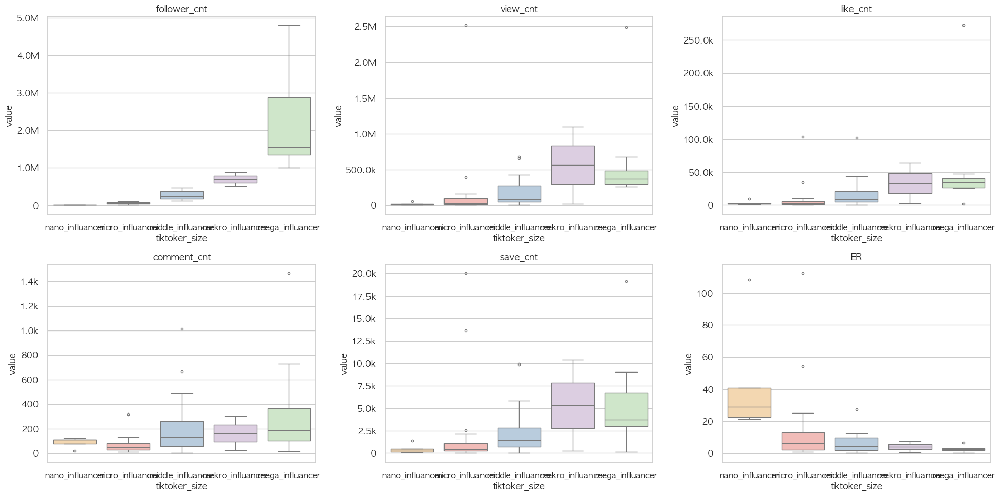

In [115]:
cols2 = ['follower_cnt', 'view_cnt', 'like_cnt', 'comment_cnt', 'save_cnt', 'ER']
size_order = ['nano_influancer', 'micro_influancer', 'middle_influancer', 'mekro_influancer', 'mega_influancer']

# 박스플롯 시각화
fig, axes = plt.subplots(2, 3, figsize=(20, 10))
for ax, col in zip(axes.flatten(), cols2):
    sns.boxplot(
        x='tiktoker_size',
        y=col,
        data=mean_df,
        ax=ax,
        palette='Pastel1',
        order=size_order,  # 원하는 순서
        fliersize=3,
        hue = "tiktoker_size"
    )
    ax.set_title(col)
    ax.set_ylabel("value")
    ax.yaxis.set_major_formatter(formatter)
plt.tight_layout()
plt.show()


----

In [116]:
# 코릴레이션 구하기
mean_df.rename(columns={'upload_gap':'avg_upload_interval'}, inplace=True)
corr_df = mean_df[["view_cnt","like_cnt","comment_cnt",	"save_cnt",	 "ad_cost",	"ER",	"avg_upload_interval","follower_cnt"]]
corr_df.corr()

,view_cnt,like_cnt,comment_cnt,save_cnt,ad_cost,ER,avg_upload_interval,follower_cnt
view_cnt,1.00,0.88,0.60,0.89,0.47,0.39,-0.12,0.47
like_cnt,0.88,1.00,0.76,0.82,0.56,0.20,-0.10,0.56
comment_cnt,0.60,0.76,1.00,0.66,0.45,0.03,-0.13,0.45
save_cnt,0.89,0.82,0.66,1.00,0.35,0.43,-0.12,0.35
ad_cost,0.47,0.56,0.45,0.35,1.00,-0.18,-0.18,1.00
ER,0.39,0.20,0.03,0.43,-0.18,1.00,0.03,-0.18
avg_upload_interval,-0.12,-0.10,-0.13,-0.12,-0.18,0.03,1.00,-0.18
follower_cnt,0.47,0.56,0.45,0.35,1.00,-0.18,-0.18,1.00


In [117]:
# 마이크로 인플루언서 추출
micro_df = mean_df[mean_df['tiktoker_size'] == 'micro_influancer']
micro_df.reset_index(drop=True, inplace=True)

# er : 5% 이상, 업로드 주기 : 1주일 이하인 마이크로 인플루언서 추출
micro_df[(micro_df['ER'] >= 5) & (micro_df['avg_upload_interval'] < 7)].reset_index()

# 다음 10명의 영상들을 시정하고 얼굴이 안나오는 인플루언서, 자사 컨셉과 맞지않는 인플루언서, 광고 목적에 맞지 않는 인플루언서 제외
# 남은 5명의 인플루언서들 중 가장 광고에 적합한 컨텐츠를 올리는 인플루언서 2명 선정 : emchu, krystallee2222

,index,name,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt,avg_upload_interval,tiktoker_size,ad_cost,ER,ERV,EV,EV_residual
0,1,4chriisty,79500.00,26122.50,4119.73,74.13,385.37,2.48,micro_influancer,1590000000.00,5.28,17.53,4579.23,0.30
1,2,__.annie.s,37300.00,10332.73,2375.10,128.47,465.10,3.14,micro_influancer,746000000.00,6.71,28.73,2968.67,0.66
2,3,_luvwonsnnx,23900.00,8783.47,1593.63,57.87,261.97,1.48,micro_influancer,478000000.00,6.91,21.78,1913.47,0.36
3,4,aeiezo.pdf,21400.00,20647.13,2587.73,95.90,350.23,3.48,micro_influancer,428000000.00,12.54,14.69,3033.87,0.09
4,8,emchu_,72700.00,39188.43,4089.50,33.50,549.13,3.41,micro_influancer,1454000000.00,5.67,11.92,4672.13,-0.02
5,10,its.kaylas,51100.00,24006.93,4257.87,32.47,874.60,1.31,micro_influancer,1022000000.00,8.40,21.51,5164.93,0.50
6,13,krystallee2222,65200.00,392343.33,35183.00,120.30,13670.83,2.24,micro_influancer,1304000000.00,54.15,12.48,48974.13,0.38
7,14,kwyeona,29000.00,18345.80,3900.70,317.47,824.53,2.31,micro_influancer,580000000.00,14.55,27.49,5042.70,0.70
8,16,ofeemi7,98700.00,152066.00,8523.07,28.90,2160.83,1.34,micro_influancer,1974000000.00,8.66,7.04,10712.80,-0.34
9,19,thelipstickgirly,92900.00,2518470.00,104070.37,319.57,20036.77,2.76,micro_influancer,1858000000.00,112.37,4.94,124426.70,-0.27


##### 2-5. 인플루언서 영상 주제 라벨링 및 주요 컨셉 추출

In [118]:
# 토픽별 키워드 설정
topics = {
    "색조 메이크업": ["blush", "eyeshadow", "lipstick", "makeuplook",'wakemake','eye palette', 'makeup','grwmmakeup',"foundation", "concealer", "basemakeup", "primer"],
    "스킨케어 & 피부 관리": ["skincare", "glassskin", "moisturizer", "serum",'mixsoon','glow','skin','dermatologist','exfoliating','toner','reedle shot','cleansing','acne'],
    "헤어 & 바디케어": [ "bodycare",  "bodymist",'hair'],
    "패션 & 스타일링": ["fashion", "ootd", "style", "trendy"],
    "언박싱 & 쇼핑": ["unboxing", "haul", "shopping", "firstimpression",'miniso'],
    "피부관리 루틴": ["morningroutine", "nightroutine", "selfcare", "routine"],
    "이슈 & 트렌드": ["trending", "viral", "tiktokban"],
    "ASMR & 감성 콘텐츠": ["asmr", "relaxing", "aesthetic", "vlog", 'grwm', 'gurwm',"study", "studymotivation", "productivity"],
    "먹방" : ['eating','eat','flavor','flavors','buldak','ramen']
}

# 각 행에 해당하는 토픽을 할당하는 함수
def assign_topic(text):
    assigned_topics = []
    for topic, keywords in topics.items():
        if any(keyword in text.lower() for keyword in keywords):
            assigned_topics.append(topic)
    return ", ".join(assigned_topics) if assigned_topics else "기타"

# 데이터프레임에 새로운 토픽 열 추가
tiktoker_df["cleaned_info"] = tiktoker_df["cleaned_info"].astype(str).fillna("")
tiktoker_df["topic"] = tiktoker_df["cleaned_info"].apply(assign_topic)

# 분류된 데이터 상위 10개 확인
tiktoker_df.head(10)


,name,follower_cnt,upload_date,view_cnt,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,...,stpw_processed_hash_tag,tiktoker_size,ad_cost,prev_date,upload_gap,upload_gap_diff,avg_upload_gap_change,upload_date_str,upload_y_m,topic
299,.blissdiaries,81700.00,2024-09-23,9209,807,48,92,I recieved this product for free from picky an...,"@Picky,@Picky,@numbuzin,#foryou,#pickyreview,#...",i recieved this product for free from picky an...,...,[foryoupickyreviewgopickypickyxnumbuzinnumbuzi...,micro_influancer,1634000000.00,NaT,NaN,NaN,-0.11,2024-09-23,2024-09,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠"
298,.blissdiaries,81700.00,2024-09-27,8462,923,46,116,I recieved this product for free from picky an...,"@Picky,@Picky,@Dr.G,#foryou,#pickyreview,#gopi...",i recieved this product for free from picky an...,...,[gforyoupickyreviewgopickypickyxdrgdrgkbeautyw...,micro_influancer,1634000000.00,2024-09-23,4.00,NaN,-0.11,2024-09-27,2024-09,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠"
295,.blissdiaries,81700.00,2024-09-28,16300,2106,62,298,yesstyle perfect lips mix & match- swatches 🎀🩰...,"@YesStyleInfluencers,#fyp,#foryou,#yesstyle,#y...",yesstyle perfect lips mix match swatches 🎀🩰 u...,...,[fypforyouyesstyleyesstyleinfluencersyesstyleb...,micro_influancer,1634000000.00,2024-09-27,1.00,-3.00,-0.11,2024-09-28,2024-09,"색조 메이크업, 패션 & 스타일링, 언박싱 & 쇼핑"
296,.blissdiaries,81700.00,2024-09-28,16600,2550,71,321,i cant help it okay 💔💔 use yesstyle rewards co...,"#fyp,#foryou,#yesstyle,#lippies,#wonyoungism,#...",i cant help it okay 💔💔 use yesstyle rewards co...,...,[fypforyouyesstylelippieswonyoungismwonyounggi...,micro_influancer,1634000000.00,2024-09-28,0.00,-1.00,-0.11,2024-09-28,2024-09,"색조 메이크업, 패션 & 스타일링"
297,.blissdiaries,81700.00,2024-09-28,15700,2456,73,454,yesstyle perfect lips - mix & match 🐰🎀 the cut...,"@YesStyle,@YesStyleInfluencers,#fyp,#foryou,#y...",yesstyle perfect lips mix match 🐰🎀 the cutes...,...,[fypforyouyesstyleyesstyleinfluencersyesstyleb...,micro_influancer,1634000000.00,2024-09-28,0.00,0.00,-0.11,2024-09-28,2024-09,"색조 메이크업, 패션 & 스타일링, ASMR & 감성 콘텐츠"
294,.blissdiaries,81700.00,2024-09-30,10300,975,69,106,Purito seoul August supporters campaign 🎋 - Pu...,"@Purito,#fyp,#foryou,#purito,#wonyoungism,#won...",purito seoul august supporters campaign 🎋 pur...,...,[fypforyoupuritowonyoungismwonyoungskincarekor...,micro_influancer,1634000000.00,2024-09-28,2.00,2.00,-0.11,2024-09-30,2024-09,"스킨케어 & 피부 관리, 패션 & 스타일링, 이슈 & 트렌드"
292,.blissdiaries,81700.00,2024-10-02,30300,5389,138,877,decorate my clio palette with me 🐰🎀 clio palet...,"@yesstyleinfluencers,@cliocosmetics_global,#fy...",decorate my clio palette with me 🐰🎀 clio palet...,...,[fypforyouwonyoungismwonyoungclioyesstyleyesst...,micro_influancer,1634000000.00,2024-09-30,2.00,0.00,-0.11,2024-10-02,2024-10,"색조 메이크업, 패션 & 스타일링, ASMR & 감성 콘텐츠"
293,.blissdiaries,81700.00,2024-10-02,14500,1831,50,267,peach & lily’s glass skin refining serum ⋆౨ৎ˚⟡...,"@BAZZAAL,@Peach,#foryou,#wonyoungism,#wonyoung...",peach lily’s glass skin refining serum ⋆౨ৎ˚⟡˖...,...,[foryouwonyoungismwonyoungpeachandlilyglassski...,micro_influancer,1634000000.00,2024-10-02,0.00,-2.00,-0.11,2024-10-02,2024-10,"스킨케어 & 피부 관리, 패션 & 스타일링, 먹방"
291,.blissdiaries,81700.00,2024-10-04,13800,1435,75,166,ive found my new favourite toner pads 😋\n|I us...,"#foryou,#cellfusionc,#cellfuer,#ksuncare\n#las...",ive found my new favourite toner pads 😋\ni use...,...,"[foryoucellfusionccellfuerksuncar, lasersunscr...",micro_influancer,1634000000.00,2024-10-02,2.00,2.00,-0.11,2024-10-04,2024-10,"스킨케어 & 피부 관리, 패션 & 스타일링, 언박싱 & 쇼핑"
290,.blissdiaries,81700.00,2024-10-14,19300,1713,73,282,A must have beauty advent calendar to end 2024...,"@Stylevana,#fyp,#foryou,#kbeauty,#wonyoungism,...",a must have beauty advent calendar to end 2024...,...,[fypforyoukbeautywonyoungismwonyoung25daysofbe...,micro_influancer,1634000000.00,2024-10-04,10.00,8.00,-0.11,2024-10-14,2024-10,"색조 메이크업, 스킨케어 & 피부 관리, 패션 & 스타일링, 언박싱 & 쇼핑"


In [119]:
tiktoker_df.info()

<class 'pandas.DataFrame'>
Index: 1680 entries, 299 to 1230
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   name                     1680 non-null   str           
 1   follower_cnt             1680 non-null   float64       
 2   upload_date              1680 non-null   datetime64[us]
 3   view_cnt                 1680 non-null   int64         
 4   like_cnt                 1680 non-null   int64         
 5   comment_cnt              1680 non-null   int64         
 6   save_cnt                 1680 non-null   int64         
 7   info                     1664 non-null   str           
 8   hash_tag                 1620 non-null   str           
 9   cleaned_info             1680 non-null   str           
 10  cleaned_hash_tag         1620 non-null   str           
 11  tokenized_info           1664 non-null   object        
 12  tokenized_hash_tag       1620 non-null   object 

In [120]:
topic_df = tiktoker_df[['name','cleaned_info','topic']]
topic_df

,name,cleaned_info,topic
299,.blissdiaries,i recieved this product for free from picky an...,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠"
298,.blissdiaries,i recieved this product for free from picky an...,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠"
295,.blissdiaries,yesstyle perfect lips mix match swatches 🎀🩰 u...,"색조 메이크업, 패션 & 스타일링, 언박싱 & 쇼핑"
296,.blissdiaries,i cant help it okay 💔💔 use yesstyle rewards co...,"색조 메이크업, 패션 & 스타일링"
297,.blissdiaries,yesstyle perfect lips mix match 🐰🎀 the cutes...,"색조 메이크업, 패션 & 스타일링, ASMR & 감성 콘텐츠"
...,...,...,...
1234,widyaatharva01,renungan …\n\n\n\nfyp renungan kematian,기타
1232,widyaatharva01,follow akun baru kit guys \n\n\n\nskincarerout...,"스킨케어 & 피부 관리, 피부관리 루틴"
1233,widyaatharva01,follow akun baru satu lagi ya guys \n\n\n\nski...,"스킨케어 & 피부 관리, 피부관리 루틴"
1231,widyaatharva01,hai sahabat wglow …\napa kabar kakak pastiny...,스킨케어 & 피부 관리


In [121]:
len(topic_df.name.unique())

56

In [122]:
topic_df["color_tf"] = topic_df["topic"].fillna("").apply(lambda x: "색조 메이크업" in x)
topic_df["skincare_tf"] = topic_df["topic"].fillna("").apply(lambda x: "스킨케어 & 피부 관리" in x)
topic_df["hair_body_tf"] = topic_df["topic"].fillna("").apply(lambda x: "헤어 & 바디케어" in x)
topic_df["fashiion_tf"] = topic_df["topic"].fillna("").apply(lambda x: "패션 & 스타일링" in x)
topic_df["unboxing_tf"] = topic_df["topic"].fillna("").apply(lambda x: "언박싱 & 쇼핑" in x)
topic_df["skin_routine_tf"] = topic_df["topic"].fillna("").apply(lambda x: "피부관리 루틴" in x)
topic_df["trend_tf"] = topic_df["topic"].fillna("").apply(lambda x: "이슈 & 트렌드" in x)
topic_df["asmr"] = topic_df["topic"].fillna("").apply(lambda x: "ASMR & 감성 콘텐츠" in x)
topic_df["eating_tf"] = topic_df["topic"].fillna("").apply(lambda x: "먹방" in x)
topic_df['others_tf'] = topic_df["topic"].fillna("").apply(lambda x: "기타" in x)

In [123]:
topic_df.head(3)

,name,cleaned_info,topic,color_tf,skincare_tf,hair_body_tf,fashiion_tf,unboxing_tf,skin_routine_tf,trend_tf,asmr,eating_tf,others_tf
299,.blissdiaries,i recieved this product for free from picky an...,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠",False,True,False,True,False,False,False,True,False,False
298,.blissdiaries,i recieved this product for free from picky an...,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠",False,True,False,True,False,False,False,True,False,False
295,.blissdiaries,yesstyle perfect lips mix match swatches 🎀🩰 u...,"색조 메이크업, 패션 & 스타일링, 언박싱 & 쇼핑",True,False,False,True,True,False,False,False,False,False


In [135]:
# 토픽별 영상 개수
#true_counts = topic_df.iloc[:, 3:].applymap(lambda x: 1 if x else 0).sum()
#true_counts

"""
applymap은 pandas 2.1 이후 deprecated → 2.2 환경에서는 제거된 경우가 있습니다. 현재 환경에서는 DataFrame에 해당 메서드가 없어 AttributeError가 발생합니다.
또한 코드 목적을 보면 토픽 컬럼에서 True 값의 개수를 세는 것입니다. 이 경우 applymap 자체가 필요 없습니다. pandas에서는 boolean → sum() 만으로 바로 계산됩니다.
"""

true_counts = topic_df.iloc[:, 3:].sum()
true_counts

color_tf           384
skincare_tf        984
hair_body_tf       114
fashiion_tf        325
unboxing_tf        161
skin_routine_tf    419
trend_tf           243
asmr               474
eating_tf          131
others_tf          204
dtype: int64

In [137]:
# 인플루언서별 각 토픽에 해당하는 영상 개수
#influencer_counts = topic_df.iloc[:, 3:].applymap(lambda x: 1 if x else 0).groupby(topic_df.iloc[:, 0]).sum().reset_index()
#influencer_counts

influencer_counts = (
    topic_df.iloc[:, 3:].groupby(topic_df.iloc[:,0]).sum().reset_index()
)
influencer_counts

,name,color_tf,skincare_tf,hair_body_tf,fashiion_tf,unboxing_tf,skin_routine_tf,trend_tf,asmr,eating_tf,others_tf
0,.blissdiaries,18,17,1,29,17,5,3,8,1,0
1,.m.egan,5,13,1,3,4,5,0,2,2,5
2,.woniluv,6,9,2,3,4,9,7,7,1,4
3,4chriisty,10,8,0,15,4,4,3,4,0,3
4,__.annie.s,8,22,0,18,2,7,0,22,0,0
5,_luvwonsnnx,8,21,0,11,7,0,14,27,1,0
6,aeiezo.pdf,4,22,0,3,2,14,5,6,7,6
7,ameenbeautytips,0,29,0,0,0,0,0,0,11,1
8,amyflamy1,12,15,1,5,2,18,0,22,6,4
9,asiamelon,3,20,0,13,5,2,1,1,2,4


In [138]:
# 각 인플루언서별 가장 많이 사용된 topic top3 선정
def get_top_two(row):
    # 각 행에서 'name' 열을 제외하고, 다른 컬럼들에 대해 숫자형으로 변환
    row = row[1:].apply(pd.to_numeric, errors='coerce')
    
    # 가장 큰 두 개의 값을 구함
    top_two = row.nlargest(3)
    
    return pd.Series([top_two.index[0], top_two.index[1], top_two.index[2]], index=['no.1', 'no.2', 'no.3'])

# 'name' 열을 제외하고, 나머지 컬럼에서 가장 큰 두 개의 값 추출
influencer_counts[['no.1', 'no.2', 'no.3']] = influencer_counts.apply(get_top_two, axis=1)

print(influencer_counts[['name', 'no.1', 'no.2', 'no.3']])

                 name             no.1             no.2             no.3
0       .blissdiaries      fashiion_tf         color_tf      skincare_tf
1             .m.egan      skincare_tf         color_tf  skin_routine_tf
2            .woniluv      skincare_tf  skin_routine_tf         trend_tf
3           4chriisty      fashiion_tf         color_tf      skincare_tf
4          __.annie.s      skincare_tf             asmr      fashiion_tf
5         _luvwonsnnx             asmr      skincare_tf         trend_tf
6          aeiezo.pdf      skincare_tf  skin_routine_tf        eating_tf
7     ameenbeautytips      skincare_tf        eating_tf        others_tf
8           amyflamy1             asmr  skin_routine_tf      skincare_tf
9           asiamelon      skincare_tf      fashiion_tf      unboxing_tf
10           ayheyt3u      skincare_tf         color_tf  skin_routine_tf
11         aylennpark      skincare_tf         color_tf        others_tf
12         bwnniewony      skincare_tf             

In [139]:
# Top 3 데이터 확인
display(influencer_counts['no.1'].value_counts())
display(influencer_counts['no.2'].value_counts())
display(influencer_counts['no.3'].value_counts())

no.1
skincare_tf        35
asmr                8
fashiion_tf         3
others_tf           3
color_tf            2
trend_tf            2
hair_body_tf        1
eating_tf           1
skin_routine_tf     1
Name: count, dtype: int64

no.2
color_tf           15
skin_routine_tf    12
skincare_tf         8
fashiion_tf         5
others_tf           5
asmr                4
trend_tf            4
eating_tf           2
hair_body_tf        1
Name: count, dtype: int64

no.3
skin_routine_tf    14
unboxing_tf         6
asmr                6
skincare_tf         5
trend_tf            5
eating_tf           5
color_tf            5
fashiion_tf         4
others_tf           4
hair_body_tf        2
Name: count, dtype: int64

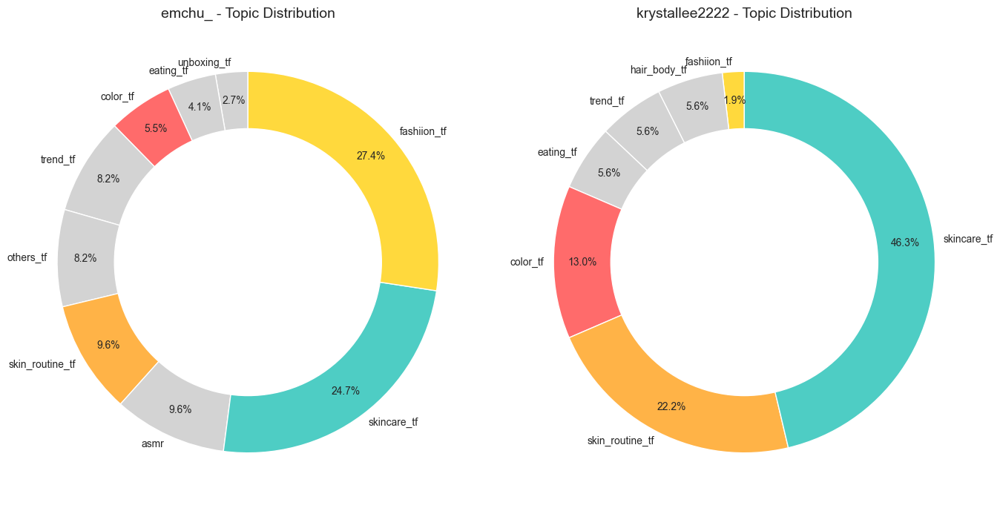

emchu_ Top 3 Topics:
1. fashiion_tf
2. skincare_tf
3. skin_routine_tf

----------------------------------------

krystallee2222 Top 3 Topics:
1. skincare_tf
2. skin_routine_tf
3. color_tf

----------------------------------------



In [140]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

color_mapping = {
    'color_tf': '#FF6B6B',        # 강조: 진한 빨강
    'skincare_tf': '#4ECDC4',     # 강조: 청록 (일반 스킨케어)
    'hair_body_tf': '#D3D3D3',    # 톤 다운
    'fashiion_tf': '#FFD93D',     # 강조: 노랑
    'unboxing_tf': '#D3D3D3',     # 톤 다운
    'skin_routine_tf': '#FFB347', # 강조: 오렌지 (스킨 루틴 별도)
    'trend_tf': '#D3D3D3',        # 톤 다운
    'asmr': '#D3D3D3',            # 톤 다운
    'eating_tf': '#D3D3D3',       # 톤 다운
    'others_tf': '#D3D3D3'        # 톤 다운
}

selected_influencers = influencer_counts[influencer_counts['name'].isin(['krystallee2222', 'emchu_'])]

# subplot 생성: 1행 2열
fig, axes = plt.subplots(1, len(selected_influencers), figsize=(14,7))

if len(selected_influencers) == 1:  # 인플루언서가 1명일 때
    axes = [axes]

for ax, (_, row) in zip(axes, selected_influencers.iterrows()):
    name = row['name']
    topic_cols = influencer_counts.columns[1:11]
    counts = row[topic_cols]
    
    counts = counts[counts > 0].sort_values(ascending=True)
    colors = [color_mapping[col] for col in counts.index]
    
    wedges, texts, autotexts = ax.pie(
        counts, 
        labels=counts.index, 
        autopct='%1.1f%%', 
        startangle=90,
        colors=colors,
        textprops={'fontsize': 10},
        pctdistance=0.85,
        labeldistance=1.05
    )
    
    # 도넛형
    centre_circle = plt.Circle((0,0),0.70,fc='white')
    ax.add_artist(centre_circle)
    ax.set_title(f'{name} - Topic Distribution', fontsize=14)

plt.tight_layout()
plt.show()

# Top 3 토픽 출력
for _, row in selected_influencers.iterrows():
    print(f"{row['name']} Top 3 Topics:")
    print(f"1. {row['no.1']}")
    print(f"2. {row['no.2']}")
    print(f"3. {row['no.3']}")
    print("\n" + "-"*40 + "\n")

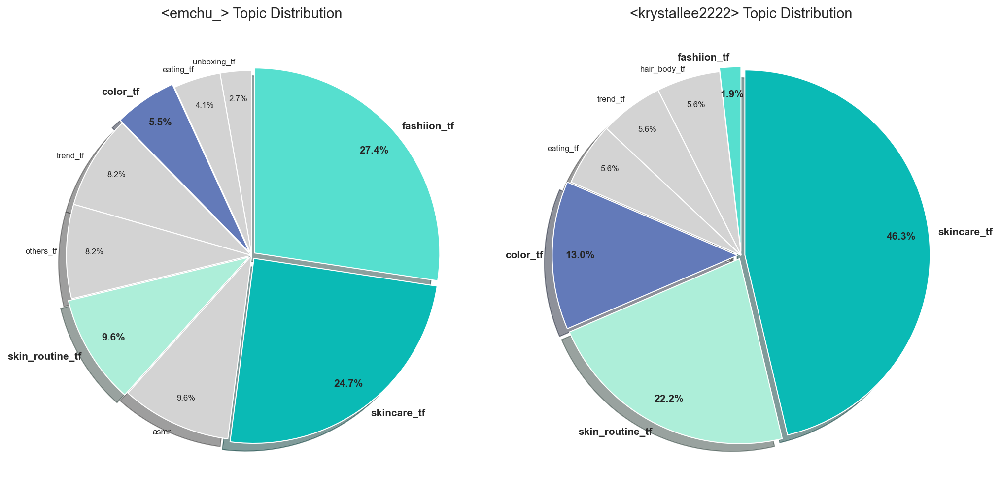

emchu_ Top 3 Topics:
1. fashiion_tf
2. skincare_tf
3. skin_routine_tf

----------------------------------------

krystallee2222 Top 3 Topics:
1. skincare_tf
2. skin_routine_tf
3. color_tf

----------------------------------------



In [141]:
import matplotlib.pyplot as plt

# 색상 매핑
color_mapping = {
    'color_tf': '#637AB9',        # 강조: 진한 빨강
    'skincare_tf': '#0ABAB5',     # 강조: 청록
    'hair_body_tf': '#D3D3D3',    # 톤 다운
    'fashiion_tf': '#56DFCF',     # 강조: 노랑
    'unboxing_tf': '#D3D3D3',     # 톤 다운
    'skin_routine_tf': '#ADEED9', # 강조: 오렌지
    'trend_tf': '#D3D3D3',        # 톤 다운
    'asmr': '#D3D3D3',            # 톤 다운
    'eating_tf': '#D3D3D3',       # 톤 다운
    'others_tf': '#D3D3D3'        # 톤 다운
}

selected_influencers = influencer_counts[influencer_counts['name'].isin(['krystallee2222', 'emchu_'])]

# subplot: 1행 2열, dpi 높게
fig, axes = plt.subplots(1, len(selected_influencers), figsize=(14,7), dpi=150)

if len(selected_influencers) == 1:
    axes = [axes]

for ax, (_, row) in zip(axes, selected_influencers.iterrows()):
    name = row['name']
    topic_cols = influencer_counts.columns[1:11]
    counts = row[topic_cols]
    
    # 0 값 제거 + 오름차순 정렬
    counts = counts[counts > 0].sort_values(ascending=True)
    
    colors = [color_mapping[col] for col in counts.index]
    explode = [0.02 if col in ['color_tf','skincare_tf','skin_routine_tf','fashiion_tf'] else 0 for col in counts.index]
    
    wedges, texts, autotexts = ax.pie(
        counts, 
        labels=counts.index,
        autopct='%1.1f%%',
        startangle=90,
        colors=colors,
        explode=explode,
        shadow=True,
        pctdistance=0.85,
        labeldistance=1.05
    )
    
    # 레이블 글자 크기 조정
    for i, text in enumerate(texts):
        if counts.index[i] in ['color_tf','skincare_tf','skin_routine_tf','fashiion_tf']:
            text.set_fontsize(10)
            text.set_weight('bold')
        else:
            text.set_fontsize(8)
            text.set_weight('light')
    
    # 퍼센트 글자 크기 조정
    for i, at in enumerate(autotexts):
        if counts.index[i] in ['color_tf','skincare_tf','skin_routine_tf','fashiion_tf']:
            at.set_fontsize(10)
            at.set_weight('bold')
        else:
            at.set_fontsize(8)
            at.set_weight('light')
    
    ax.set_title(f'<{name}> Topic Distribution', fontsize=14)

plt.tight_layout()
plt.show()

# Top 3 토픽 출력
for _, row in selected_influencers.iterrows():
    print(f"{row['name']} Top 3 Topics:")
    print(f"1. {row['no.1']}")
    print(f"2. {row['no.2']}")
    print(f"3. {row['no.3']}")
    print("\n" + "-"*40 + "\n")

## PART 3: Tiktoker recommend

In [142]:
mean_df = mean_df.merge(influencer_counts, on='name', how='left')

In [143]:
# 쉼표 제거 및 숫자로 변환
cols_to_int = ["follower_cnt", "view_cnt", "like_cnt", "comment_cnt", "save_cnt", "ad_cost"]
cols_to_float = ["ER", "avg_upload_interval"]

# int로 변환할 컬럼
mean_df[cols_to_int] = mean_df[cols_to_int].replace(",", "", regex=True).astype(float).round(0).astype(int)

# float (소수 둘째 자리까지)로 변환할 컬럼
mean_df[cols_to_float] = mean_df[cols_to_float].replace(",", "", regex=True).astype(float).round(2)
mean_df.head(3)

,name,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt,avg_upload_interval,tiktoker_size,ad_cost,ER,...,fashiion_tf,unboxing_tf,skin_routine_tf,trend_tf,asmr,eating_tf,others_tf,no.1,no.2,no.3
0,.blissdiaries,81700,9718,1447,60,196,4.07,micro_influancer,1634000000,1.85,...,29,17,5,3,8,1,0,fashiion_tf,color_tf,skincare_tf
1,.m.egan,238200,178070,23864,183,3527,5.03,middle_influancer,4764000000,10.10,...,3,4,5,0,2,2,5,skincare_tf,color_tf,skin_routine_tf
2,.woniluv,135600,41956,2399,86,370,2.38,middle_influancer,2712000000,1.83,...,3,4,9,7,7,1,4,skincare_tf,skin_routine_tf,trend_tf


In [144]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import MinMaxScaler


final_df3 = mean_df.copy()

scaler = MinMaxScaler()
final_df3['normalized_ER'] = scaler.fit_transform(final_df3[['ER']])

# 콘텐츠 컬럼 가중치 반영하여 합치기
# ER가 너무 낮으면 가중치 값이 0이 되어 콘텐츠 키워드가 삭제될 위험 있음
# 이를 방지하려면 최소 1번은 반영되도록 max(1, int(...)) 적용
final_df3['content_features'] = final_df3.apply(lambda x: 
    (x['no.1'] + ' ') * max(1, int(round(x['normalized_ER'] * 3, 0))) + 
    (x['no.2'] + ' ') * max(1, int(round(x['normalized_ER'] * 2, 0))) + 
    (x['no.3'] + ' ') * max(1, int(round(x['normalized_ER'], 0))),
    axis=1) 

# TF-IDF 변환
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(final_df3['content_features'])

# 기존 선택한 인플루언서 기준 유사도 측정
selected_influencers = ["krystallee2222", "emchu_"]
selected_indices = final_df3[final_df3['name'].isin(selected_influencers)].index
similarity_scores = cosine_similarity(tfidf_matrix, tfidf_matrix[selected_indices])

# 평균 유사도 점수 계산 후 정렬
final_df3["content_similarity"] = similarity_scores.mean(axis=1)
df_sorted = final_df3.sort_values(by="content_similarity", ascending=False)
df_sorted

# 최종 추천 인플루언서 리스트
top_n = 15  # 원하는 추천 개수
recommended_influencers = df_sorted.loc[~df_sorted['name'].isin(selected_influencers)].head(top_n)
display(recommended_influencers[["name", "content_similarity"]])

,name,content_similarity
14,cleangirlhacks,0.73
28,jasminnlily_,0.73
13,caspertheghostyy,0.73
36,minseonk1m,0.73
1,.m.egan,0.73
24,its.kaylas,0.73
17,dearwonii_,0.73
10,ayheyt3u,0.73
51,thelipstickgirly,0.66
37,misscasxie,0.62


2025년 이후 : jasminnlily_,caspertheghostyy, minseonk1m, dearwonii_, thelipstickgirly, 
2024 년도 이전 : .blissdiaries, 

6 / 13

추적 관찰한 결과 50% 가 torriden의 광고를 제의 받음.

In [145]:
import pandas as pd
from scipy.stats import chi2_contingency

# 브랜드별 상위 키워드 (TF-IDF 기반 예시)
data = {
    "Brand": ["자사", "Dr.Jart+", "COSRX", "I’m From", "조선미녀", "PURITO"],
    "Keywords": [
        ["hydrated", "calming", "smooth", "absorption", "gentle", "soft", "cream", "soothing", "lightweight", "moisturizer"],
        ["moisturizing", "calming", "cream", "hydration", "soothing", "gentle", "smooth", "sensitive", "formula", "barrier"],
        ["snail", "cica", "acne", "calming", "routine", "irritation", "redness", "soothing", "effect", "skin"],
        ["natural", "gentle", "calming", "absorption", "soft", "smooth", "cream", "lightweight", "effect", "soothing"],
        ["glow", "antioxidant", "radiance", "gentle", "moisturizing", "cream", "brightening", "effect", "smooth", "soothing"],
        ["gentle", "oat", "sensitive", "soothing", "cream", "moisturizing", "soft", "absorption", "effect", "lightweight"]
    ]
}

df = pd.DataFrame(data)

# 전체 키워드 목록 생성
all_keywords = sorted({kw for kws in df["Keywords"] for kw in kws})

# 키워드 등장 여부를 Binary Matrix로 변환
binary_matrix = pd.DataFrame(0, index=df["Brand"], columns=all_keywords)
for i, row in df.iterrows():
    for kw in row["Keywords"]:
        binary_matrix.loc[row["Brand"], kw] = 1

print("🔹 브랜드별 키워드 Binary Matrix:\n")
print(binary_matrix.head())

# Chi-square test 수행
chi2, p, dof, expected = chi2_contingency(binary_matrix)

print("\n🔹 Chi-square 검정 결과:")
print(f"Chi2 통계량: {chi2:.3f}")
print(f"p-value: {p:.5f}")
print(f"자유도: {dof}")
if p < 0.05:
    print("➡ 귀무가설 기각: 브랜드 간 키워드 분포에 유의한 차이가 있음.")
else:
    print("➡ 귀무가설 채택: 브랜드 간 키워드 분포에 유의한 차이가 없음.")


🔹 브랜드별 키워드 Binary Matrix:

          absorption  acne  antioxidant  barrier  brightening  calming  cica  \
Brand                                                                          
자사                 1     0            0        0            0        1     0   
Dr.Jart+           0     0            0        1            0        1     0   
COSRX              0     1            0        0            0        1     1   
I’m From           1     0            0        0            0        1     0   
조선미녀               0     0            1        0            1        0     0   

          cream  effect  formula  ...  oat  radiance  redness  routine  \
Brand                             ...                                    
자사            1       0        0  ...    0         0        0        0   
Dr.Jart+      1       0        1  ...    0         0        0        0   
COSRX         0       1        0  ...    0         0        1        1   
I’m From      1       1        0  ...    0

In [146]:
tiktoker_df.head(1)

,name,follower_cnt,upload_date,view_cnt,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,...,stpw_processed_hash_tag,tiktoker_size,ad_cost,prev_date,upload_gap,upload_gap_diff,avg_upload_gap_change,upload_date_str,upload_y_m,topic
299,.blissdiaries,81700.00,2024-09-23,9209,807,48,92,I recieved this product for free from picky an...,"@Picky,@Picky,@numbuzin,#foryou,#pickyreview,#...",i recieved this product for free from picky an...,...,[foryoupickyreviewgopickypickyxnumbuzinnumbuzi...,micro_influancer,1634000000.00,NaT,NaN,NaN,-0.11,2024-09-23,2024-09,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠"


In [147]:
keyword_df.head(1)

,search_term,vedio_order,tiktoker_name,upload_date,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,cleaned_hash_tag,tokenized_info,tokenized_hash_tag,removed_info,removed_hash_tag,stpw_processed_info,stpw_processed_hash_tag,upload_date_str,upload_y_m
0,clean_beauty,1,morganlkeen,2024-09-05,1563,73,894,Replying to @user8022071884889 Non-Toxic Makeu...,@user8022071884889,replying to nontoxic makeup blushes powder cr...,,"[replying, to, nontoxic, makeup, blushes, powd...",[],"[replying, nontoxic, makeup, blushes, powder, ...",[],"[repli, nontox, makeup, blush, powder, cream, ...",[],2024-09-05,2024-09
